<h6><center>Wikipedia Articles Clustering & Classification Challenge</center></h6>

<h1>
<hr style=" border:none; height:3px;">
<center>Part 1: Wikipedia articles graph-based clustering</center>
<hr style=" border:none; height:3px;">
</h1>

__Author__: Alassane Watt -- github.com/tawlas

# Introduction

The goal of this challenge is to develop models able to determine topics of wikipedia articles. There are three topics:
- Tech
- Business
- Cybersecurity

The first part of this challenge cosists of a graph based clustering and the second part is about a multi-class classification task of the wikipedia articles.


__Graph Clustering:__
Graph class implemented from scratch.

Graph Clustering algorithms: Connected components of a graph where the nodes are the articles. 

__Classification:__
Classifying a given article among one of the three classes mentioned above.

Classification algorithms: Linear Support Vector Machine (LinearSVM), Random Forest, Multinomial Naive Bayes and Logistic Regression.<br><br>

# Table of Content


* [Importing packages](#imp)
* [Helper functions](#hf)
* [Loading data](#ld)
* [Exploratory Data Analysis (EDA) and Feature Engineering](#eda)
* [Data Preprocessing](#pre)
* [Graph Clustering](#gc)
    * [Graph](#g)
    * [Connected components](#cc)
* [Analysis of the graph clustering results](#agc)
    * [Observation & Discussion](#od)
* [Cluster titles](#ct)
* [Study of an example of clustering](#ex)
* [End to End Pipeline](#eep)
* [Quality discussion](#qd)
* [ML algorithms with similar performance](#mlp)
    * [3D visualization of articles](#viz)
    * [ML clustering models](#mcm)
        - [Supervised clustering](#sc)
        - [Unsupervised clustering](#uc)
* [Unit tests](#ut)
    * [Preprocessing tests](#pret)
    * [Graph clustering tests](#gct)
    

<a id='imp'></a>
## Importing packages

In [284]:
import os
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from io import StringIO
from collections import Counter
import re
import copy
import random
import string
import statistics as ss
import datetime
from IPython.core.display import display, HTML 
from math import log2
from tqdm import tqdm
from wordcloud import WordCloud
from concurrent.futures import ProcessPoolExecutor, as_completed
import time
from utils import my_workers

<a id='hf'></a>
## Helper functions

In [3]:
from utils.utils import print_progress_bar, linspace

<a id='ld'></a>
## Loading data

Let's load the __wikipedia articles__ as well as the __stopwords__ used inside the [Data Preprocessing section](#pre).

In [4]:
# articles data
try:
    articles_path = os.path.join("..", "data", "source", "dataset_business_technology_cybersecurity.pickle")
    with open(articles_path, 'rb') as f:
        articles = pickle.load(f)

    print("Nb of articles loaded:", len(articles))
except:
    raise Exception("Error loading articles data")

# stopwords
try:
    
    stopwords_path = os.path.join("..", "data", "source", "stopwords.txt")
    with open(stopwords_path) as f:
        stopwords = [word.strip() for word in f.readlines()]

    print("Stop words size:", len(stopwords))
except:
    raise Exception("Error loading stopwords")

Nb of articles loaded: 333
Stop words size: 1313


Let's visualize some examples of articles. Change the index in the cell below to visualize different articles.

In [283]:
example = articles[1]
display(HTML(example['content']))

There are common terms shared across all the articles such as See also, References, External links. Those terms are irrelevant for our purpose and are added inside our stopwords list. We also note that each Wikipedia article contains a summary in the beginning. Such part of an article might even suffice to determine the topic of an article. We'll see if that'll prove to be powerful enough to reflect a topic.

<a id='eda'></a>
## Exploratory Data Analysis (EDA) and Feature Engineering

In this section we are going to explore in depth our data.
We are going to have a look at the:
+ [Dataset size](#ds)
+ [Data structure checking (the structure of our data)](#dsc)
+ [Duplicates checking](#dc)
+ [Topic statistics](#ts)


<a id='ds'></a>
__Dataset size__

In [6]:
print("There are {} articles.".format(len(articles)))

There are 333 articles.


<a id='dsc'></a>
__Data structure checking__

Do all dict items of the dataset have the same keys ?

In [7]:
all([item.keys() == articles[0].keys() for item in articles])

True

<a id='dc'></a>
__Duplicates checking__

In [8]:
title_counts = Counter([article['title'] for article in articles])
n_unique_titles = len([t for t in title_counts if title_counts[t] == 1])
n_duplicates = len(articles) - n_unique_titles
print("Nb of unique articles: {} out of {}, ({:.3}%).".format(n_unique_titles, len(articles), 100*n_unique_titles/len(articles)))


Nb of unique articles: 312 out of 333, (93.7%).


This result shows there are 93.7% of unique titles. Let's visualize the duplicate titles.

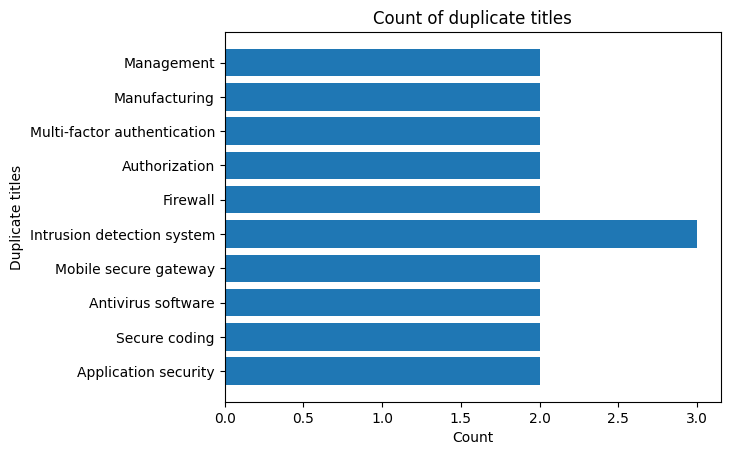

In [9]:
duplicated_titles = [(title,count) for title, count in title_counts.items() if title_counts[title] > 1]

plt.rcdefaults()
fig, ax = plt.subplots()

# Example data
titles = [t[0] for t in duplicated_titles]
y_pos = np.arange(len(titles))
counts = [t[1] for t in duplicated_titles]

ax.barh(y_pos, counts, align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(titles)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Count')
ax.set_ylabel('Duplicate titles')
ax.set_title('Count of duplicate titles')

plt.show()

Now let's quickly check whether articles with duplicate titles have the same content.

In [10]:
# Checking whether the articles with the same name share the same content.
dups_bool = [False]*len(duplicated_titles)
for i in range(len(duplicated_titles)):
    dups = [a['content'] for a in articles if a['title'] == duplicated_titles[i][0]]
    dups_bool[i] = all([content == dups[0] for content in dups])
all(dups_bool)

True

The previous analysis shows that there are duplicated articles in the dataset. Therefore, we remove the duplicates.

In [11]:
# Removes duplicate articles
def remove_duplicate_articles(articles, verbose=False):
    """ Removes duplicate articles """
    titles = set()
    dup_free_articles = []
    for article in articles:
        title = article['title']
        if title not in titles:
            titles.add(title)
            dup_free_articles.append(article)
    if verbose:
        print('Found and removed {} duplicate articles.'.format(
            len(articles) - len(dup_free_articles)))
        print('New dataset size: {}.'.format(len(dup_free_articles)))
    return dup_free_articles

In [12]:
articles = remove_duplicate_articles(articles, True)

Found and removed 11 duplicate articles.
New dataset size: 322.


<a id='ts'></a>
__Topic statistics__

Let'see the distribution of our topics.

There are:
	101 business articles.
	130 technology articles.
	91 cybersecurity articles.


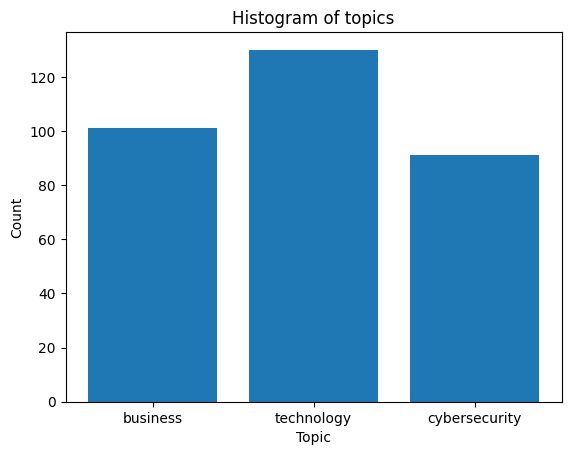

In [13]:
topic_counts = Counter([article['topic'] for article in articles])

print("There are:")
for topic, count in topic_counts.items():
    print("\t{} {} articles.".format(count, topic))

plt.bar(topic_counts.keys(), topic_counts.values())
plt.ylabel("Count")
plt.xlabel("Topic")
plt.title('Histogram of topics')
plt.show()

<a id='pre'></a>
## Data Preprocessing

Below are the data processing steps I followed:
* __Summary extraction__
* __Title and content concatenation__
* __HTML tag removal__
* __Text Normalization:__
    - __Text-case lowering__
    - __Special characters removal__
* __Tokenization__
* __Stop words removal__

__Summary extraction__:
One can automatically categorize the type of article he or she is reading. We want a machine that is able to do the same thing or better. However, after experimentation, the clustering results are better when we take into account the whole text. However, I deemed it worth it to put it here to show that I have thought about it. In the final model, we will not include it in the preprocessing as it reduces the clustering performance.

__Title and content concatenation__:
A title is a major indicator of the topic of an article. Therefore, we concatenate each article's title with its content to feed the whole to our model.

__HTML tag removal__:
Since these tags are not useful for our task, we remove them. To do so, we use regular expressions to remove r'<\*>'-like patterns.

__Text-case lowering__:
We do not want our model to be case dependant.

__Special characters removal__:
Special characters are not insightful, we remove them. We only preserve a-z text and numbers. 

__Tokenization__:
We perform a space-based splitting.

__Stop words removal__:
Stopwords are very common words. Words like “we”  and “are” do not help in determining the topic of a document since they appear in any kind of text. We thus remove the stopwords to leave only meaningful words. The stops-words are loaded from a local file inside the project folder.


**Not implemented preprocessing techniques:**
We could have included further preprocessing steps such as:
- Stemming
- Lemmatization
- POS Tagging

To do that, I would be using packages outside python's standard library packages which is prohibited by the problem statement for part 1-A. One idea would be to build my own good stemming and lemmatization modules but that would be a little time-consuming. To keep it simple and as it is not the spirit of the challenge to get the highest score possible, I decided not to do include those preprocessing techniques in part 1-A. However, *Stemming* is implemented in part 1-B before using a K-Means and Hierarchical clustering algorithm and also in part 2, the classification part of this challenge.


In the next cell, we define different preprocessing functions for the different steps of our processing pipeline.

In [14]:
# ** Data preprocessing part

# Gets the summary of a wikipedia article
def get_summary(html_text):
    """ 
    Returns the summary part of the raw html text string of the wikipedia article
    """
    end_summary_index = html_text.find('<h')
    summary = html_text[:end_summary_index]
    return summary


# remove tags
def remove_tags(html_text):
    """ Remove the html tags of the given text using regex. """
    tags_regex = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')
    tag_free_text = re.sub(tags_regex, ' ', html_text)
    return tag_free_text


# combine title and content of article
def concatenate_title_and_text(title, text):
    """ Concatenate the title and the content of an article """
    content = " ".join([title, text])
    return content


# remove special chars
def remove_special_chars(raw_text):
    """ Removes the special characters of the given text. """
    spec_free_text = re.sub(r'[^A-Za-z0-9\$]+', ' ', raw_text).strip()
    return spec_free_text


# add token counts
def add_tokens_count(article):
    """ Add a count dict of the tokens of an article as a new key to the article dict. """
    article['tokens_count'] = Counter(article['text'])
    return article


# tokenization
def tokenize(content):
    """ Tokenizes the given text. """
    return content.split(" ")


# remove stopwords
def remove_stop_words(content, stopwords):
    """ Removes stopwords in the given text. """
    return [token for token in content if token not in stopwords]


# apply above preprocessing steps on a single article
def preprocess_article(article, stopwords, summary, title):
    """ Apply all the processing steps on the input article. 
    @params: 
    article: a wikipedia article
    stopwords: list of stop-words
    summary: Whether to stick with the summary. Boolean
    title:   Whether to include the title as feature. Boolean
    """

    text = article['content']
    title = article['title']
    
    if summary:
        # get the summary of the wikipedia article
        text = get_summary(text)
    # remove tags
    text = remove_tags(text)
    if title:
        # concatenate
        text = concatenate_title_and_text(title, text)
    # lower case
    text = text.lower()
    # remove special chars
    text = remove_special_chars(text)
    # tokenization
    text = tokenize(text)
    # remove stopwords
    text = remove_stop_words(text, stopwords)

    article['text'] = text
    # add words count
    article = add_tokens_count(article)
    return article


# apply above preprocessing steps on a all articles
def preprocess_articles(articles, stopwords, summary=False, title=True):
    """ Apply all the processing steps on the given article dataset
    @params: 
    article: a wikipedia article
    stopwords: list of stop-words
    summary: Whether to stick with the summary. Boolean
    title:   Whether to include the title as feature. Boolean
    """

    articles = list(
        map(lambda article: preprocess_article(article, stopwords, summary, title), articles))
    
    print(f'Preprocessing of {len(articles)} artilces succesfully done!')
    return articles

Let's apply the preprocessing steps described above.

In [15]:
# summary=False indicates we are taking the whole text instead of the summary only.
articles = preprocess_articles(articles, stopwords, summary=False, title=True)

<a id="dt"></a>
### Distribution of the number of tokens per article

Let's now plot the distribution of the number of tokens inside each article after preprocessing. We'll plot both the number of tokens counted repeatedly and the number of unique tokens for each article.

In [16]:
# Article length: Nb of tokens counted repeatedly
def get_articles_length(articles):
    """ Returns a dict where the keys are the articles titles and values are the number of tokens counted repeatedly
        inside of the corresponding articles.
    """
    length_dict = {article['title']: len(
        article['text']) for article in articles}
    return length_dict


# Number of unique tokens for each article
def get_articles_unique_token_sizes(articles):
    """ Returns a dict where the keys are the articles titles and values are the number of unique tokens 
        inside of the corresponding articles.
    """
    unique_token_size = {article['title']: len(
        article['tokens_count']) for article in articles}
    return unique_token_size

In [17]:
# Number of tokens counted repeatedly
length_dict = get_articles_length(articles)

In [18]:
# Number of unique tokens
unique_token_sizes = get_articles_unique_token_sizes(articles)

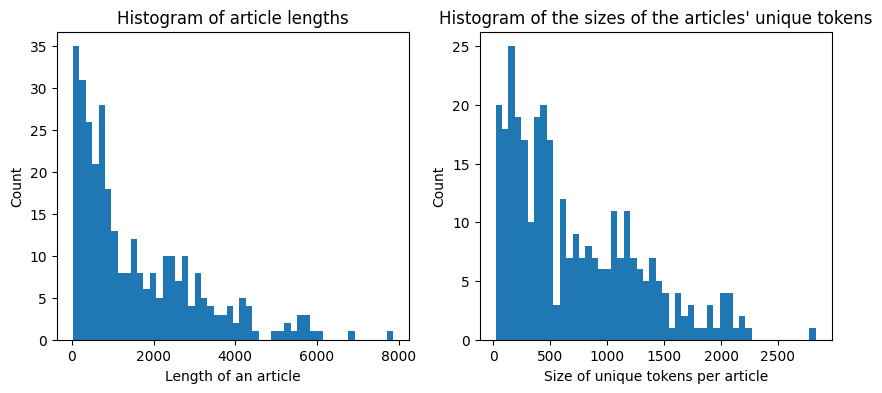

In [19]:
# Plotting the histogram of article lengths
plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)
plt.hist(length_dict.values(), bins=50)
plt.ylabel("Count")
plt.xlabel("Length of an article")
plt.title('Histogram of article lengths')

# Plotting unique tokens size for each article
plt.subplot(1,2,2)
plt.hist([len(article['tokens_count']) for article in articles], bins=50)
plt.ylabel("Count")
plt.xlabel("Size of unique tokens per article")
plt.title('Histogram of the sizes of the articles\' unique tokens')

plt.show()

We observe that most of the article's sizes are between around 10 to 4000 token instances. The distribution of the article lengths globally decreases as the length of an article increases. The same applies to the distribution of articles' unique tokens whose span the 10-2000 interval.

Let's now compute more statistics about the tokens of the articles.
We compute the following statistics for both instances of tokens and tokens counted once:
- count : number of articles
- mean : mean sizes of tokens
- stdev : standard deviation of the sizes of the tokens
- median : median size of the tokens
- min : minimum tokens size
- max: maximum tokens size

In [20]:
def compute_token_statistiques(tokens_dict):
    """
    Compute statistics about articles tokens.
    @params:
        tokens_dict      - Required  : a list of dicts with the title of an article as key
                                       and the nb of tokens of that article as value  (list of dicts)
    Returns a dict containing the following statistics about the input clusters:
        - count : number of articles
        - mean : mean sizes of tokens
        - stdev : standard deviation of the sizes of the tokens
        - median : median size of the tokens
        - min : minimum tokens size
        - max maximum tokens size
    """
    stats = {}
    counts = [tokens_dict[title] for title in tokens_dict]
    stats['count'] = len(counts)
    stats['mean'] = int(ss.mean(counts))
    stats['stdev'] = int(ss.stdev(counts))
    stats['median'] = ss.median_high(counts)
    stats['min'] = min(counts)
    stats['max'] = max(counts)
    return stats

In [21]:
# articles length
articles_length_stats = compute_token_statistiques(length_dict)
print("Article lengths statistics:\n", articles_length_stats)


Article lengths statistics:
 {'count': 322, 'mean': 1580, 'stdev': 1494, 'median': 1010, 'min': 23, 'max': 7866}


In [22]:
# unique token sizes
unique_token_sizes_stats = compute_token_statistiques(unique_token_sizes)
print("Unique tokens sizes statistics:\n", unique_token_sizes_stats)


Unique tokens sizes statistics:
 {'count': 322, 'mean': 707, 'stdev': 565, 'median': 498, 'min': 19, 'max': 2834}


<a id='gc'></a>
## Graph clustering

Let's implement from scratch our `Graph` class as well as the methods allowing us to cluster our wikipedia articles.

### Graph

This implementation supports both directed and undirected graphs, but for our purpose, I describe it in the context of an undirected graph. Let's denote $n$ the number of vertices and $m$ the number of edges in our adjacency map-based graph.

I use a variant of the adjacency map representation. For each vertex $v$, I use a Python dictionary to represent the secondary incidence map $I(v)$. I maintain a top-level dictionary $D$ that maps each vertex $v$ to its incidence map $I(v)$. A vertex does not need to explicitly maintain a reference to its position in $D$, because it can be determined in $O(1)$ expected time. Rather than maintain a list of edges $E$, we are content with taking the union of the edges found in the various incidence maps; technically, this runs in $O(n+m)$ time rather than strictly $O(m)$ time, as the dictionary $D$ has $n$ keys, even if some incidence maps are empty.

Classes `Vertex` and `Edge`, are rather simple, and can be nested within the more complex `Graph` class. Note that I define the `__hash__` method for both `Vertex` and `Edge` so that those instances can be used as keys in Python’s hash-based sets and dictionaries.

#### __Complexity analysis__:
By using a hash-based map to implement $I(v)$ for each vertex $v$, we optimize computation performance. Specifically, we let the opposite endpoint of each incident edge serve as a key in the map, with the edge structure serving as the value. The space usage for an adjacency map is $O(n+m)$, because $I(v)$ uses $O(deg(v))$ space for each vertex $v$.

The advantage of the adjacency map is that the $get_edge(u,v)$ method can be implemented in expected $O(1)$ time by searching for vertex u as a key in $I(v)$, or vice versa. However, the worst-case bound is $O(min(deg(u),deg(v)))$.

###### __Operation__: __Running Time__

`vertex_count()`, `edge_count()`: $O(1)$

`insert_vertex(x)`, `insert_edge(u,v,x)`: $O(1)$

`vertices()`: $O(n)$

`incident_edges(v)`: $O(deg(v))$

`get_edge(u,v)`: $O(1)$


Let's denote:
- $c$ the connectivity threshold between two articles,
- $r$ the max number of token across all the articles, and
- $t$ the max number of character of a token over all the articles.


To build our graph, we first add the vertices as node: since `insert_vertex(x)` is computed in $O(1)$ inserting all our vertices takes $O(n)$ time. Then we compute the adjacency map of our article's graph. To do so, we first invoke the `_vertices()_` method which takes $O(n)$ running time. Then for each vertex $u$, we iterate through all the vertices $v$ connected to our articles and check whether they are connected. The connectivity checking takes $O(ct)$ expected time or $O(rt)$ worst-case time. Therefore the time complexity for building the adjacency map is in $O(rtnˆ2)$ or more simply $O(nˆ2)$. We finally connect the edges thanks to the adjacency map in $O(n)$ running time, since for each vertex $u$, `insert_edge(u,v,x)` in the hash map takes $O(1)$ time.

Thus, overall, building our graph takes $O(nˆ2))$ running time. It is not the best performance but this implementation provides by far the best performance for all the operations of interest as you can see above. Since a graph is built once and used many time afterwards, we deem it worth it.


In [23]:
# *********************** Graph class *********************************
class Graph:
    """ Adjacency map-based graph implementation """

    # *********************** Vertex class *********************************
    class Vertex:
        """Lightweight vertex structure for a graph."""
        __slots__ = '_element'

        def __init__(self, x):
            """Do not call constructor directly. Use Graph s insert vertex(x)."""
            self._element = x

        def element(self):
            """Return element associated with this vertex."""
            return self._element

        def __hash__(self):  # will allow vertex to be a map/set key
            return hash(id(self))

    # *********************** Edge Class *********************************
    class Edge:
        """Lightweight edge structure for a graph."""
        __slots__ = '_origin', '_destination', '_element'

        def __init__(self, u, v, x):
            """Do not call constructor directly. Use Graph s insert edge(u,v,x)."""
            self._origin = u
            self._destination = v
            self._element = x

        def endpoints(self):
            """Return (u,v) tuple for vertices u and v."""
            return (self._origin, self._destination)

        def opposite(self, v):
            """Return the vertex that is opposite v on this edge."""
            return self._destination if v is self._origin else self._origin

        def element(self):
            """Return element associated with this edge."""
            return self._element

        def __hash__(self):  # will allow edge to be a map/set key
            return hash((self._origin, self._destination))

    # *********************** Graph class methods *********************************
    def __init__(self, articles, connectivity_threshold=20, unique=True, directed=False):
        """Create an empty graph (undirected, by default).

        Graph is directed if optional paramter is set to True.
        """
        self._outgoing = {}
        # only create second map for directed graph; use alias for undirected
        self._incoming = {} if directed else self._outgoing
        self._connectivity_threshold = connectivity_threshold
        self._unique = unique
        self.initilialize_graph(articles)

    def do_share_n_unique_tokens(self, article_1, article_2):
        """ Check whether two articles share a number of unique tokens greater than the connectivity threshold value """
        common_tokens = set(article_1['tokens_count'].keys()).intersection(
            article_2['tokens_count'].keys())
        n_common_tokens = len(common_tokens)
        if n_common_tokens >= self._connectivity_threshold:
            return n_common_tokens
        else:
            return 0

    def do_share_n_token_instances(self, article_1, article_2):
        """ Check whether two articles share a number of token instances greater than the connectivity threshold value """

        common_tokens = set(article_1['tokens_count'].keys()).intersection(
            article_2['tokens_count'].keys())
        n_token_instances_1 = sum(
            [article_1['tokens_count'][token] for token in common_tokens])
        n_token_instances_2 = sum(
            [article_2['tokens_count'][token] for token in common_tokens])
        n_common_token_instances = min(
            n_token_instances_1, n_token_instances_2)
        if n_common_token_instances > self._connectivity_threshold:
            return n_common_token_instances
        else:
            return 0

    def initilialize_graph(self, articles):
        """ Build the graph. Add all the articles vertices and connect them. """
        for article in articles:
            self.insert_vertex(article)

        adjacency_map = self.build_adjacency_map()  # main bottleneck
        for u in adjacency_map:
            for v, n_common_words in adjacency_map[u]:
                self.insert_edge(u, v, n_common_words)

    def build_adjacency_map(self):
        """ Build the adjacency map of the graph. """
        adjacency_map = {}
        vertices = self.vertices()
        for u in vertices:
            article_1 = u.element()
            title_1 = article_1['title']
            adjacency_map[u] = set()
            for v in vertices:
                article_2 = v.element()
                title_2 = article_2['title']
                if self._unique:
                    n_common_words = self.do_share_n_unique_tokens(
                        article_1, article_2)
                else:
                    n_common_words = self.do_share_n_token_instances(
                        article_1, article_2)
                if title_1 != title_2 and n_common_words:
                    adjacency_map[u].add((v, n_common_words))

        return adjacency_map

    def is_directed(self):
        """Return True if this is a directed graph; False if undirected.

        Property is based on the original declaration of the graph, not its contents.
        """
        return self._incoming is not self._outgoing  # directed if maps are distinct

    def vertex_count(self):
        """Return the number of vertices in the graph."""
        return len(self._outgoing)

    def vertices(self):
        """Return an iteration of all vertices of the graph."""
        return self._outgoing.keys()

    def edge_count(self):
        """Return the number of edges in the graph."""
        total = sum(len(self._outgoing[v]) for v in self._outgoing)
        # for undirected graphs, make sure not to double-count edges
        return total if self.is_directed() else total // 2

    def edges(self):
        """Return a set of all edges of the graph."""
        result = set()  # avoid double-reporting edges of undirected graph
        for secondary_map in self._outgoing.values():
            # add edges to resulting set
            result.update(secondary_map.values())
        return result

    def get_edge(self, u, v):
        """Return the edge from u to v, or None if not adjacent."""
        return self._outgoing[u].get(v)  # returns None if v not adjacent

    def degree(self, v, outgoing=True):
        """Return number of (outgoing) edges incident to vertex v in the graph.

        If graph is directed, optional parameter used to count incoming edges.
        """
        adj = self._outgoing if outgoing else self._incoming
        return len(adj[v])

    def incident_edges(self, v, outgoing=True):
        """Return all (outgoing) edges incident to vertex v in the graph.

        If graph is directed, optional parameter used to request incoming edges.
        """
        adj = self._outgoing if outgoing else self._incoming
        for edge in adj[v].values():
            yield edge

    def insert_vertex(self, x=None):
        """Insert and return a new Vertex with element x."""
        v = self.Vertex(x)
        self._outgoing[v] = {}
        if self.is_directed():
            # need distinct map for incoming edges
            self._incoming[v] = {}
        return v

    def insert_edge(self, u, v, x=None):
        """Insert and return a new Edge from u to v with auxiliary element x."""
        e = self.Edge(u, v, x)
        self._outgoing[u][v] = e
        self._incoming[v][u] = e


Note that in our design choice, the graph is built when we instantiate the `Graph` class in the `__init__` function.

<a id="cc"></a>
### Connected components

We introduce two functions `DFS` and `DFS_complete` to cluster our articles. `DFS` is a depth-first search algorithm and `DFS_complete` uses `DFS` to compute the connected components of our graph.

In [24]:
def DFS(g, u, discovered, cluster):
    """Perform DFS of the undiscovered portion of Graph g starting at Vertex u.
    @params:
    discovered is a dictionary mapping each vertex to the edge that was used to
    discover it during the DFS. (u should be ”discovered” prior to the call.)
    Newly discovered vertices will be added to the dictionary as a result.
    """
    for e in g.incident_edges(u):  # for every outgoing edge from u
        v = e.opposite(u)
        if v not in discovered:  # v is an unvisited vertex
            discovered[v] = e  # e is the tree edge that discovered v
            cluster.append(v)
            DFS(g, v, discovered, cluster)  # recursively explore from v


def DFS_complete(g):
    """Perform DFS for entire graph and return forest as a dictionary.
    @params:
    g               - Required  :   Graph object

    Result maps each vertex v to the edge that was used to discover it.
    (Vertices that are roots of a DFS tree are mapped to None.)
    
    """
    forest = {}
    clusters = {}
    c = 0
    for u in g.vertices():
        if u not in forest:
            forest[u] = None  # u will be the root of a tree
            cluster = [u]
            DFS(g, u, forest, cluster)
            clusters[c] = cluster
            c += 1
    return forest, clusters

In terms of its running time, depth-first search is an efficient method for traversing a graph. Note that `DFS` is called at most once on each vertex (since it gets marked as visited), and therefore every edge is examined at most twice for our undirected graph (once from each of its end vertices).
If we let $n_s <= n$ be the number of vertices reachable from a vertex $s$, and $m_s <= m$ be the number of incident edges to those vertices, a `DFS` starting at $s$ runs in $O(n_s+m_s)$ since `incident_edges(v)` takes $O(deg(v))$ the time, and the `e.opposite(v)` method takes $O(1)$ time and we have a way to "mark" a vertex or edge as explored. Because the dictionary is hash-based, the test, `if v not in discovered` and the record-keeping step, `discovered[v] = e`, run in $O(1)$ expected time, rather than worst-case time. Although the `DFS_complete` function makes multiple calls to the original `DFS` function, the total time spent by a call to `DFS_complete` is $O(n+m)$. Because each call to `DFS` explores a different component, the sum of $n_s+m_s$ terms is $n+m$.

Since we are experimenting with several connectivity threshold values, let's now implement a function that will run `DFS_complete` and get the results of the clusterings for all the values and store them in a dict where the keys are those connectivity threshold values.

In [25]:
def get_all_connectivity_threshold_clusters(articles, connectivity_threshold_values, unique=True):
    """
    Create clusters of articles for different connectivity threshold.
    @params:
        articles                       - Required  : the wikipedia articles (list of dicts)
        connectivity_threshold_values  - Required  : The different values of connectivity threshold above which
                                                     two articles are considered connected. (Int[])
        unique                         - Optional  : Indicates whether to count tokens uniquely or repeatedly (Boolean)
    Returns:
        all_connectivity_threshold_clusters: a dict whose keys are the different connectivity thresholds and 
        the values are nested dicts containing the clusters of corresponding connectivity thresholds

    """
    all_connectivity_threshold_clusters = {str(connectivity_threshold): {
    } for connectivity_threshold in connectivity_threshold_values}

    # Display a progress bar
    progress = 0
    print_progress_bar(progress, len(connectivity_threshold_values),
                       prefix='Progress:', suffix='Complete', length=50)
    for connectivity_threshold in connectivity_threshold_values:
        clusters_dict = {}
        g = Graph(articles, connectivity_threshold, unique=unique)
        forests, clusters = DFS_complete(g)
        clusters_dict['clusters'] = clusters
        clusters_dict['forests'] = forests
        all_connectivity_threshold_clusters[str(
            connectivity_threshold)] = clusters_dict

        # Display a progress bar
        progress += 1
        print_progress_bar(progress, len(connectivity_threshold_values),
                           prefix='Progress:', suffix='Complete', length=50)

    return all_connectivity_threshold_clusters

As a reminder, a connectivity threshold between two articles is the number of common tokens in both articles above which those articles are considered connected.

We count the number of tokens in two different ways:
- Token counted once:
Meaning only one instance of any token is counted.
- Token counted repeatedly:
Meaning we count the repeated instances of any token.


In the following, we try 10 connectivity threshold values sampled for each type of counting between the minimum number of tokens and the maximum number of tokens across all articles. Note that we sample more values around the left side of the interval since, as we have seen in the [distibution of the number of tokens per article](#dt) study, there are more counts for articles closer to the minimum number of tokens for both types of counting.

__Tokens counted once__

In [26]:
n_min = int(unique_token_sizes_stats['min'])
n_max = int(unique_token_sizes_stats['max'])

connectivity_threshold_values = list(linspace(n_min, n_max//3, 7)) + list(linspace(n_max//3, n_max, 3))
unique_token_clusters = get_all_connectivity_threshold_clusters(articles, connectivity_threshold_values)


Progress: |██████████████████████████████████████████████████| 100.0% Complete


__Tokens counted repeatedly__

In [27]:
n_min = int(articles_length_stats['min'])
n_max = int(articles_length_stats['max'])
connectivity_threshold_values = list(linspace(n_min, n_max//3, 7)) + list(linspace(n_max//3, n_max, 3))
token_instances_clusters = get_all_connectivity_threshold_clusters(articles, connectivity_threshold_values, unique=False)


Progress: |██████████████████████████████████████████████████| 100.0% Complete


Now that we have our clusters for each connectivity threshold, let's analyze the results of our clustering.

<a id="agc"></a>
## Analysis of the graph clustering results

Let's compute some statistics about the clusters and visualize some results.

We'll compute for each connectivity threshold the:
- number of clusters
- mean size of all the clusters.
- standard deviation of the sizes of the clusters
- median size of the clusters
- minimum cluster size
- maximum cluster size


In [28]:
def compute_statistics(clusters):
    """
    Compute statistics about clusters.
    @params:
        clusters                - Required  : the input wikipedia articles (list of dicts)
    Returns a dict containing the following statistics about the input clusters:
        - n_clusters : number of clusters
        - mean : mean sizes of clusters
        - stdev : standard deviation of the sizes of the clusters
        - median : median size of the clusters
        - min : minimum clusters size
        - max : maximum clusters size
    """
    stats = {}
    cluster_sizes = [len(clusters[c]) for c in clusters]
    stats['n_clusters'] = len(clusters)
    stats['mean'] = ss.mean(cluster_sizes)
    stats['stdev'] = ss.stdev(cluster_sizes)
    stats['median'] = ss.median_high(cluster_sizes)
    stats['min'] = min(cluster_sizes)
    stats['max'] = max(cluster_sizes)

    return stats


def add_clusters_statistics(all_connectivity_threshold_clusters):
    """
    Compute some statistics about the clusters for a list of connectivity threshold values.
    @params:
        all_connectivity_threshold_clusters - Required: the clusters output by 
                                                        get_all_connectivity_threshold_clusters function (list of dicts)

    Returns the input clusters dict with a new key containing statistics about the input clusters
    computed by "compute_statistics" function.

    """
    for key in all_connectivity_threshold_clusters:
        clusters = all_connectivity_threshold_clusters[key]['clusters']
        all_connectivity_threshold_clusters[key]['statistics'] = compute_statistics(
            clusters)

    return all_connectivity_threshold_clusters


def plot_clustering_results(all_connectivity_threshold_clusters):
    """ Plot the clusters statistics added to the clusters dict """
    connectivity_threshold_values = sorted(all_connectivity_threshold_clusters.keys(), key=int)
    n_clusters_values = [all_connectivity_threshold_clusters[threshold]['statistics']['n_clusters'] for threshold in connectivity_threshold_values]
    mean_cluster_size_values = [all_connectivity_threshold_clusters[threshold]['statistics']['mean'] for threshold in connectivity_threshold_values]
    std_cluster_size_values = [all_connectivity_threshold_clusters[threshold]['statistics']['stdev'] for threshold in connectivity_threshold_values]
    min_cluster_size_values = [all_connectivity_threshold_clusters[threshold]['statistics']['min'] for threshold in connectivity_threshold_values]
    max_cluster_size_values = [all_connectivity_threshold_clusters[threshold]['statistics']['max'] for threshold in connectivity_threshold_values]
    median_cluster_size_values = [all_connectivity_threshold_clusters[threshold]['statistics']['median'] for threshold in connectivity_threshold_values]

    plt.figure(figsize=(12,14))
    plt.subplots_adjust(hspace=0.5)

    plt.subplot(3,2,1)
    plt.plot(connectivity_threshold_values, n_clusters_values, '-bx')
    plt.ylabel("Nb of clusters")
    plt.xlabel("Connectivity threshold")
    plt.yticks([1] + list(range(50, int(max(n_clusters_values))+50, 50)))
    plt.title('Nb of clusters over connectivity threshold')

    plt.subplot(3,2,2)
    plt.plot(connectivity_threshold_values, min_cluster_size_values, '-ro', label='min')
    plt.plot(connectivity_threshold_values, max_cluster_size_values, '-bx', label='max')
    plt.ylabel("Min and Max sizes of clusters")
    plt.yticks([1] + list(range(50, int(max(max_cluster_size_values))+50, 50)))
    plt.xlabel("Connectivity threshold")
    plt.legend()
    plt.title('Min and Max cluster size over connectivity threshold')

    plt.subplot(3,2,3)
    plt.plot(connectivity_threshold_values, mean_cluster_size_values, '-bx')
    plt.ylabel("Mean sizes of clusters")
    plt.xlabel("Connectivity threshold")
    plt.yticks([1] + list(range(50, int(max(mean_cluster_size_values))+50, 50)))
    plt.title('Mean cluster sizes over connectivity threshold')

    plt.subplot(3,2,4) # Mean and std ranges are afar, they are plotted separately
    plt.plot(connectivity_threshold_values, std_cluster_size_values, '-bx')
    plt.ylabel("Standard deviation of sizes of clusters")
    plt.xlabel("Connectivity threshold")
    plt.yticks([1] + list(range(50, int(max(std_cluster_size_values))+50, 50)))
    plt.title('Standard deviation of cluster sizes over connectivity threshold')

    plt.subplot(3,2,5) # Mean and std ranges are afar, they are plotted separately
    plt.plot(connectivity_threshold_values, median_cluster_size_values, '-bx')
    plt.ylabel("Median cluster sizes")
    plt.xlabel("Connectivity threshold")
    plt.yticks([1] + list(range(50, int(max(median_cluster_size_values))+50, 50)))
    plt.title('Median cluster sizes over connectivity threshold')
    
    
    plt.show()


__Token counted once__

In [29]:
# adding clusters statistics
unique_token_clusters = add_clusters_statistics(unique_token_clusters)

Let's plot the results.

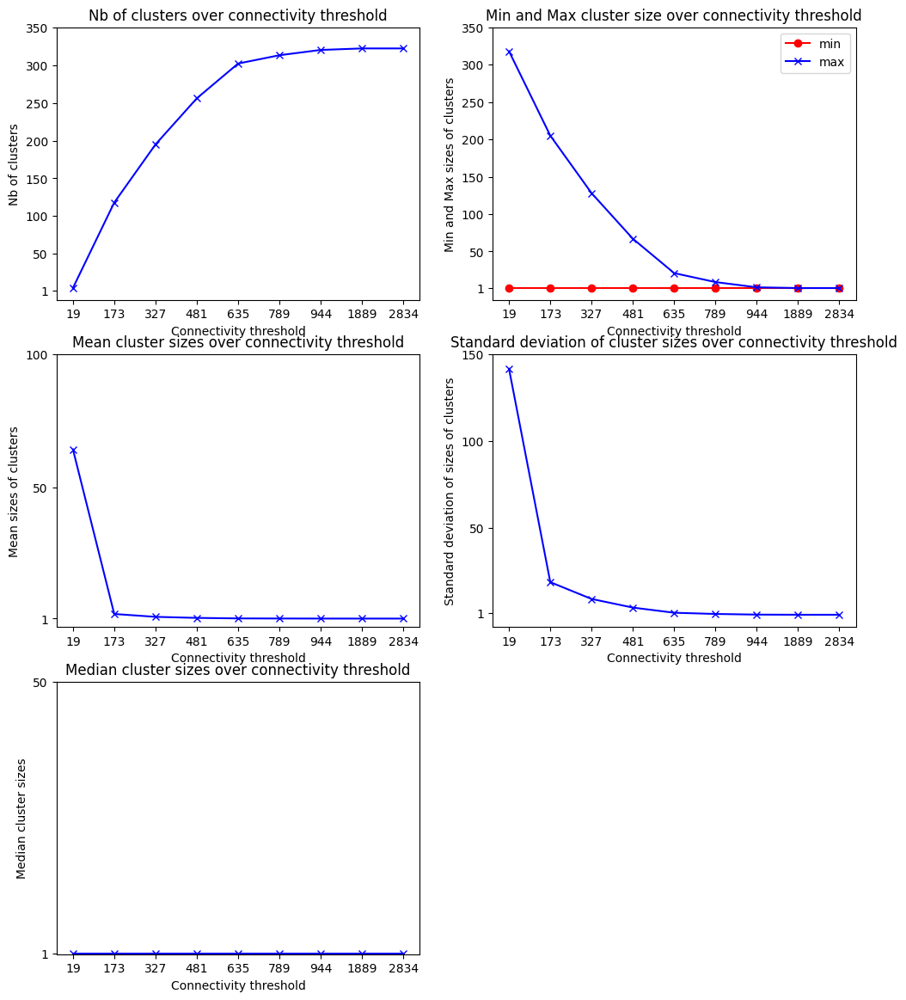

In [30]:
plot_clustering_results(unique_token_clusters)

__Token counted repeatedly__

In [31]:
token_instances_clusters = add_clusters_statistics(token_instances_clusters)

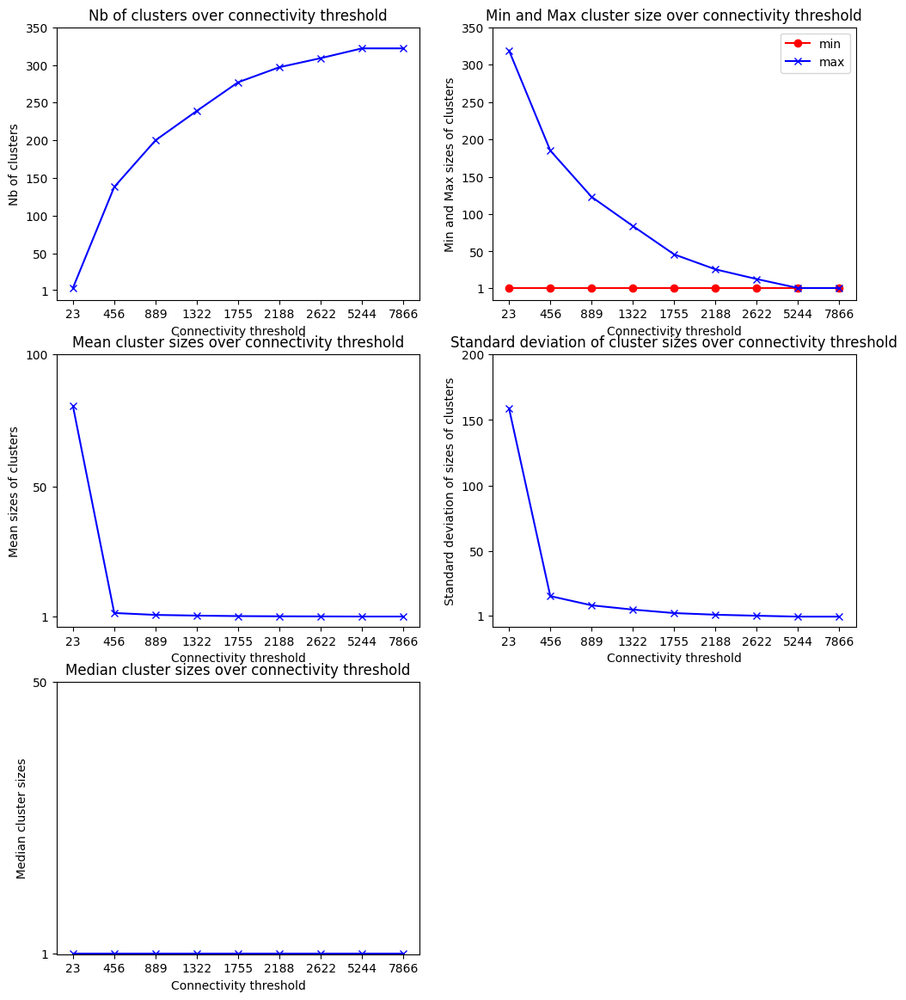

In [32]:
plot_clustering_results(token_instances_clusters)

<a id="od"></a>
##### Observation & Discussion

First of all, we notice that the two types of counting have similar shapes of curves.
We see that the number of clusters goes up as the connectivity threshold increases, which is expected as it requires to have more common tokens for two articles to be connected. As the graph of median and mean sizes of clusters show, most of the articles quickly compose their own clusters as the connectivity threshold increases. It is also highlighted by the *Max clusters sizes* curve which drops to one after around a connectivity threshold of 450 when tokens are counted repeatedly.

The problem statement made it clear about the connection criteria between a given pair of articles. Two articles are connected only if they share a number of tokens greater than a certain connectivity threshold. This sets the clustering outcome deterministic upon choosing a connectivity threshold. The same value of connectivity threshold will always give the same clustering state. Thus, apart from text preprocessing, the only parameter we can play with to change our graph is the connectivity threshold. To choose the best connectivity threshold, we compute a decisive metric for a list of connectivity threshold values and take the connectivity threshold that optimizes our metric. Now, to select a metric, there are a few angles from which we can look at the problem. We might say that we ideally want our algorithm to output a number of clusters equal to the number of topics inside our dataset. Our measure of goodness of clustering would be partially based on that. We could have a metric that penalizes the fact that there is a distance between the number of clusters output by our algorithm and the number of topics in our dataset, in addition to other elements to measure.
A more realistic approach is to come up with a metric that doesn't take into account the number of clusters in the dataset as it's a piece of information we most often lack in real-life situations. 
There are majorly two types of measures to assess clustering performance: Extrinsic Measures, which require ground truth labels, and Intrinsic Measures, which do not require ground truth labels such as Silhouette Coefficient. Extrinsic Measures such as the Silhouette Coefficient are more suited for unsupervised clustering.
However, the particularity we are facing here is that we are not representing our documents into vectors. We are using graphs. It makes sense to use graphical caracteristics to measure the goodness of our clustering. Typically, measuring the density (the ratio of the number of edges present in a group of nodes to the total number of edges possible in that group.) of our connected components, or the degree of our vertices happen to be relevant. The denser a cluster is, meaning the more connected are nodes inside our cluster, the more it shows that the articles inside the cluster are linked, which suggests a meaningful cluster whose label could be computed by following some heuristics (see [Cluster titles](#ct)). 

If I had more time I would have investigated into graph clustering measures.
There are really interesting papers online that I would have loved exploiting such as [Evaluating the Quality of Clustering Algorithms Using Cluster Path Lengths](https://www.researchgate.net/publication/47463266_Evaluating_the_Quality_of_Clustering_Algorithms_Using_Cluster_Path_Lengths) whose authors argue that Density and Cut Size based metrics play an important role in the evaluation of dense graphs but Mutuality and Compactness are also important for the evaluation of clusters in graphs that are not densely connected; and [Detection of Communities in Directed Networks based on Strongly p-Connected Components](https://hal.archives-ouvertes.fr/hal-00634309/document) for instance.


The previous results suggest to count each token once and to take a connectivity threshold of around 100. That's what we do in the End to End pipeline. (See the `config.yml` file at the root folder of this project).

<a id="ct"></a>
## Cluster titles

There are a few ways we can title clusters. Among them are *__Differential cluster labeling__* and *__Cluster-internal labeling__*.

**Differential cluster labeling** selects cluster labels by comparing the distribution of terms in one cluster with that of other clusters. Feature selection methods can be used for differential cluster labeling. In particular, mutual information (MI) or, equivalently, information gain and the $\chi ^2$-test will identify cluster labels that characterize one cluster in contrast to other clusters. A combination of a differential test with a penalty for rare terms often gives the best labeling results because rare terms are not necessarily representative of the cluster as a whole.

**Cluster-internal labeling** computes a label that solely depends on the cluster itself, not on other clusters.
Labeling a cluster with the title of the document closest to the centroid is one cluster-internal method. Titles are easier to read than a list of terms. A full title can also contain important context that didn't make it into the top terms selected by a mutual information method. However, a single document is unlikely to be representative of all documents in a cluster.

In the next section we'll study one example of clustering with a given connectivity threshold. We'll have the chance to associate a title to each cluster using a *Differential cluster labeling* method, namely, *Mutual Information*.

Mutual Information is a common technique for labelling clusters (see [Mutual Information based labelling and comparing
clusters](https://arxiv.org/pdf/1702.08199.pdf)). The Mutual Information measures how much information the presence/absence of a term $t$ contributes to making the correct clustering decision on a cluster $c$. In other words, the Mutual Information represents the reduction in uncertainty about the cluster c given the knowledge of the term $t$. A high Mutual Information between a term $t$ and a cluster $c$ suggests this term describes a large part of the content of this cluster therefore this term could be a candidate for labelling this cluster. Formally, the mutual information between a term $t$ and a cluster $c$ is calculated as follows: 

<center> $ I(t, c) = \sum_{i=0}^1\sum_{j=0}^1P(T_i, U_j )log_2(\frac{P(T_i, U_j)}{P(T_i)P(U_j)})$</center> 

where $T_0$ indicates an article does not contain the term $t$ and otherwise $T_1$, $U_0$ indicates an article does not belong to the cluster $c$ and otherwise $U_1$, $P(T_i, U_j)$ is the probability that $T_i$ and $U_j$ happen together within one article, $P(T_i)$ and $P(U_j)$ are the probabilities that these events happen independently. The probabilities are estimated by dividing the frequency of the observed event (the article contains or does not contain the term $t$ or it is in or not in the cluster $c$) by the total number of articles.

<a id="ex"></a>
### Study of an example of clustering

Let's hold a `connectivity_threshold` value of 100 and count tokens uniquely.

In [33]:
connectivity_threshold = 100

clusters_dict = {}
g = Graph(articles, connectivity_threshold, unique=True)
_, clusters = DFS_complete(g)
clusters_dict['clusters'] = clusters

In [34]:
# add cluster statistics.
clusters_dict['statistics'] = compute_statistics(clusters)
s = clusters_dict['statistics']
print(f"Nb clusters: {s['n_clusters']}")
print(f"Mean cluster sizes: {s['mean']}")
print(f"Std cluster sizes: {s['stdev']}")
print(f"Median cluster sizes: {s['median']}")
print(f"Min cluster sizes: {s['min']}")
print(f"Max cluster sizes: {s['max']}")

Nb clusters: 65
Mean cluster sizes: 4.953846153846154
Std cluster sizes: 31.876926789426577
Median cluster sizes: 1
Min cluster sizes: 1
Max cluster sizes: 258


The statistics show there are much more unit size clusters. In fact, the median cluster size is 1 and the mean size is around 5 even though the max cluster size is 258 with a number of cluster of 65. The standard deviation of around 32  highlights the variance in size. Actually there are 64 unit clusters and 1 cluster of size 258, which is far from being a good result. However, the methodology and discussions are more important in this challenge. More time would have allowed me to dive deeper into performance quest.

__Titling the clusters__

For each cluster we compute the n most important terms with respect to the mutual information metric. Those terms will be considered as titles of the clusters.

<div class="alert alert-block alert-success">
Note that I am using nesting functions inside the following cell. The reason is because Jupyter notebook is not fully compatible with multiprocessing, so I am loading a helper module named <b>my_workers.py</b> that handles lauching multiple process at a time. The module requires the callback function to have all variables it needs inside its namespace to run properly. Hence this design model.
</div>

In [128]:
def mutual_info_cluster(args):
    """ 
    Mutual information between for a cluster with all the tokens in the corpus.
    cluster_n, clusters, term_all
    @params: 
    cluster_n: a cluster number label. (int)
    clusters: a python dictionary where the keys are cluster number labels and the values are lists of graph vertices.
    term_all: a set of all the tokens in the corpus.
    Returns a tuple where the first term is the cluster number label and the second term is a list 
            of all terms and their mutual info as tuples.
    """
    from math import log2
    
    def mutual_info_term_cluster(term, articles_in_cluster, articles_not_in_cluster, articles_all):
        """ 
        Returns the mutual information between for a cluster and a term of the corpus.
        cluster_n, clusters, term_all
        @params:
        term: a term of the corpus.
        cluster_n: a cluster number label for which we compute the clustering (int)
        articles_in_cluster: a list of the articles belonging to the actual cluster.
        articles_not_in_cluster: a list of all the articles not belonging to the actual cluster.
        articles_all: a list of all the articles of our dataset. passed in for efficiency reasons. 
        """
        
        def compute_pt1(term, articles, n_articles_all):
            """ Compute the term p(T_1) of the MI expression"""
            
            # number of articles containing term
            c = 0 
            for article in articles:
                if term in article['text']: # article['text'] is a list of tokens
                    c += 1
            pt1 = c/n_articles_all
            return pt1
        # ******************************** End of compute_pt1 function **********************
        n_articles = len(articles_all)
        n_articles_in_cluster = len(articles_in_cluster)
        
        # Computing the different terms of the MI expression.
        pu1 = n_articles_in_cluster/n_articles
        pu0 = 1 - pu1
        pt1 = compute_pt1(term, articles_all, n_articles)
        pt0 = 1 - pt1
        pt1u1 = compute_pt1(term, articles_in_cluster, n_articles)
        pt1u0 = compute_pt1(term, articles_not_in_cluster, n_articles)
        pt0u1 = pu1 - pt1u1
        pt0u0 = pu0 - pt1u0
        
        # xlogx equals 0 when x == 0
        mi_1 = pt0u0*log2(pt0u0/(pt0*pu0)) if pt0u0 > 0 else 0
        mi_2 = pt0u1*log2(pt0u1/(pt0*pu1)) if pt0u1 > 0 else 0
        mi_3 = pt1u0*log2(pt1u0/(pt1*pu0)) if pt1u0 > 0 else 0
        mi_4 = pt1u1*log2(pt1u1/(pt1*pu1)) if pt1u1 > 0 else 0
        
        mi = mi_1 +  mi_2 + mi_3 + mi_4
        
        return mi
    # ******************************** End of mutual_info_term_cluster function **********************
    
    #*************************** Beginning of mutual_info_cluster, the outermost function ****************************
    
    cluster_n, clusters, term_all = args
    articles_in_cluster = [vertex.element() for vertex in clusters[cluster_n]]
    articles_not_in_cluster = []
    for n in clusters.keys():
        if n != cluster_n:
            articles_not_in_cluster.extend([vertex.element() for vertex in clusters[n]])
            
    articles_all = articles_in_cluster + articles_not_in_cluster
    mi_list = []

    mi_list = sorted([(term, mutual_info_term_cluster(term, articles_in_cluster, articles_not_in_cluster, articles_all)) for term in term_all], key=lambda x:x[1], reverse=True)
    return (cluster_n, mi_list)
        

In [132]:
def mutual_info_all(clusters, n_important):
    """ 
    Computes for each cluster the n_important terms with the highest mutual information value.  
    @params: 
    clusters: a python dictionary where the keys are cluster number labels and the values are lists of graph vertices.
    n_important: the number of terms for each cluster.
    
    Returns a dict where the keys are the cluster labels and the values are lists of terms with the highest mutual information.
    """
    
    mutual_info_per_cluster = {}
    articles = []
    for n in clusters.keys():
        articles.extend([vertex.element() for vertex in clusters[n]])
    term_all = set()
    for article in articles:
         term_all.update(set(article['text']))
    # get mutual info for each cluster for the n_important most important terms per cluster
    print(f"Nb of terms in the whole corpus: {len(term_all)}")


    cluster_keys = sorted(clusters.keys())
    
    start = time.time()
    # Implementing multiprocessing to speed up the computation
    with ProcessPoolExecutor() as executor:
        futures = set()
        
        for cluster_n in cluster_keys:
            future = my_workers.submit(executor,mutual_info_cluster, (cluster_n, clusters, term_all))
            futures.add(future)

        for future in as_completed(futures):
            cluster_n, mi_list  = future.result()
            # Saving each file as it takes time to compute them. For future use purpose.
            with open(f'../data/mi/{cluster_n}.pickle', 'wb') as f:
                pickle.dump(mi_list, f)
            mutual_info_per_cluster[cluster_n] = mi_list[:n_important]
            print(f"Cluster {cluster_n} completed.")
    end = time.time()
    print(f"finished computing all mutual info in {end-start} secs")
    return mutual_info_per_cluster
       


<div class="alert alert-block alert-warning">
    The following cell takes hours to run on normal machines (macbook pro) even with multiprocessing implemented. It aims to compute the mututal info of each term for every cluster. I have alreday run and saved the files in the data folder so I am commenting it out in case you run it inadvertantly. Please uncomment it if you want to run it.
</div>

In [133]:
# mutual_info_per_cluster = mutual_info_all(clusters, 5)

Nb of terms in the whole corpus: 37799
3 completed.
0 completed.
1 completed.
2 completed.
4 completed.
5 completed.
6 completed.
7 completed.
8 completed.
12 completed.
9 completed.
10 completed.
13 completed.
11 completed.
15 completed.
14 completed.
16 completed.
18 completed.
17 completed.
22 completed.
19 completed.
20 completed.
21 completed.
23 completed.
24 completed.
25 completed.
26 completed.
27 completed.
29 completed.
30 completed.
28 completed.
31 completed.
33 completed.
32 completed.
34 completed.
35 completed.
37 completed.
38 completed.
36 completed.
39 completed.
40 completed.
41 completed.
42 completed.
45 completed.
43 completed.
44 completed.
46 completed.
47 completed.
49 completed.
50 completed.
48 completed.
51 completed.
53 completed.
52 completed.
54 completed.
55 completed.
57 completed.
56 completed.
58 completed.
59 completed.
60 completed.
62 completed.
61 completed.
63 completed.
64 completed.
finished computing all mutual info in 31470.23096895218 secs


We print the title of each cluster. A title is a set of tokens where each token is associated with its mutual information (MI) measure with respect to the cluster. We took the 5 most important terms with respect to the MI metric.

In [173]:
for cluster_n in clusters.keys():
    display(f"Cluster {cluster_n} title:",  mutual_info_per_cluster[cluster_n])
   

'Cluster 0 title:'

[('called', 0.20198776682271552),
 ('development', 0.18029285381541413),
 ('time', 0.16796156757288377),
 ('developed', 0.16057887081220096),
 ('form', 0.1534025472646457)]

'Cluster 1 title:'

[('manickam', 0.03034586766039538),
 ('merx', 0.03034586766039538),
 ('commercium', 0.03034586766039538),
 ('ramesh', 0.024134687536172095),
 ('merchandise', 0.018233648623469836)]

'Cluster 2 title:'

[('weekdays', 0.03034586766039538),
 ('mondays', 0.03034586766039538),
 ('00am', 0.03034586766039538),
 ('thursdays', 0.03034586766039538),
 ('30pm', 0.03034586766039538)]

'Cluster 3 title:'

[('horner', 0.03034586766039538),
 ('ashgate', 0.03034586766039538),
 ('consultantsadditionally', 0.03034586766039538),
 ('9780582404441cs1', 0.03034586766039538),
 ('witlox', 0.03034586766039538)]

'Cluster 4 title:'

[('productively', 0.024134687536172095),
 ('secretarial', 0.024134687536172095),
 ('tor', 0.021790316411440507),
 ('agendas', 0.02026787853667976),
 ('charters', 0.019135804075187886)]

'Cluster 5 title:'

[('stracca', 0.03034586766039538),
 ('benvenuto', 0.03034586766039538),
 ('1509', 0.03034586766039538),
 ('ancona', 0.03034586766039538),
 ('jurists', 0.03034586766039538)]

'Cluster 6 title:'

[('roland', 0.03034586766039538),
 ('activitiesplaces', 0.03034586766039538),
 ('nebraskafilm', 0.03034586766039538),
 ('township', 0.03034586766039538),
 ('toolssee', 0.03034586766039538)]

'Cluster 7 title:'

[('laureates', 0.03034586766039538),
 ('repec', 0.03034586766039538),
 ('uruguayan', 0.03034586766039538),
 ('biographical', 0.024134687536172095),
 ('economistsreferences', 0.024134687536172095)]

'Cluster 8 title:'

[('1046', 0.03034586766039538),
 ('1029', 0.03034586766039538),
 ('birdhouse', 0.03034586766039538),
 ('0691058962', 0.03034586766039538),
 ('0865970069', 0.03034586766039538)]

'Cluster 9 title:'

[('1699', 0.03034586766039538),
 ('837', 0.03034586766039538),
 ('effectreferences', 0.03034586766039538),
 ('1499', 0.03034586766039538),
 ('lindy', 0.03034586766039538)]

'Cluster 10 title:'

[('functionalist', 0.03034586766039538),
 ('rigor', 0.024134687536172095),
 ('veracity', 0.021790316411440507),
 ('realities', 0.02026787853667976),
 ('subfields', 0.018233648623469836)]

'Cluster 11 title:'

[('multifamily', 0.03034586766039538),
 ('havelisthe', 0.03034586766039538),
 ('categorieschawls', 0.03034586766039538),
 ('inquire', 0.03034586766039538),
 ('propertyreferences', 0.03034586766039538)]

'Cluster 12 title:'

[('underconsumption', 0.03034586766039538),
 ('formreferences', 0.03034586766039538),
 ('gupta', 0.024134687536172095),
 ('shortfalls', 0.024134687536172095),
 ('fallacy', 0.02026787853667976)]

'Cluster 13 title:'

[('outmoded', 0.03034586766039538),
 ('integrationthree', 0.03034586766039538),
 ('632', 0.03034586766039538),
 ('hardcover', 0.03034586766039538),
 ('migrates', 0.03034586766039538)]

'Cluster 14 title:'

[('metaprogramming', 0.03034586766039538),
 ('metacomputing', 0.03034586766039538),
 ('metacomputer', 0.03034586766039538),
 ('rajkumar', 0.03034586766039538),
 ('buyya', 0.03034586766039538)]

'Cluster 15 title:'

[('piccinini', 0.03034586766039538),
 ('hypercomputation', 0.03034586766039538),
 ('fodor', 0.03034586766039538),
 ('microphysical', 0.03034586766039538),
 ('wetware', 0.03034586766039538)]

'Cluster 16 title:'

[('angorbiology', 0.03034586766039538),
 ('superhero', 0.03034586766039538),
 ('garde', 0.03034586766039538),
 ('takemura', 0.03034586766039538),
 ('champions', 0.03034586766039538)]

'Cluster 17 title:'

[('michel', 0.03034586766039538),
 ('designates', 0.03034586766039538),
 ('foucault', 0.03034586766039538),
 ('aristotelian', 0.03034586766039538),
 ('kantian', 0.03034586766039538)]

'Cluster 18 title:'

[('disciplineentertainment', 0.03034586766039538),
 ('electronicssee', 0.03034586766039538),
 ('electronica', 0.03034586766039538),
 ('amplifying', 0.024134687536172095),
 ('dance', 0.021790316411440507)]

'Cluster 19 title:'

[('8194', 0.03034586766039538),
 ('3286', 0.03034586766039538),
 ('57493', 0.03034586766039538),
 ('opticianreferences', 0.03034586766039538),
 ('speckle', 0.03034586766039538)]

'Cluster 20 title:'

[('latch', 0.03034586766039538),
 ('faders', 0.03034586766039538),
 ('bohemian', 0.03034586766039538),
 ('rhapsody', 0.03034586766039538),
 ('fader', 0.03034586766039538)]

'Cluster 21 title:'

[('whisperreferences', 0.03034586766039538),
 ('aas', 0.03034586766039538),
 ('choicesin', 0.03034586766039538),
 ('ivrs', 0.03034586766039538),
 ('didyouknowout', 0.03034586766039538)]

'Cluster 22 title:'

[('applicator', 0.03034586766039538),
 ('shunsuke', 0.03034586766039538),
 ('rembrandt', 0.03034586766039538),
 ('kudoh', 0.03034586766039538),
 ('paintbrush', 0.03034586766039538)]

'Cluster 23 title:'

[('collens', 0.03034586766039538),
 ('indego', 0.03034586766039538),
 ('bounces', 0.03034586766039538),
 ('mow', 0.03034586766039538),
 ('mowed', 0.03034586766039538)]

'Cluster 24 title:'

[('goshen', 0.03034586766039538),
 ('omnitown', 0.03034586766039538),
 ('curvier', 0.03034586766039538),
 ('temsa', 0.03034586766039538),
 ('lumped', 0.03034586766039538)]

'Cluster 25 title:'

[('vallorcine', 0.03034586766039538),
 ('kalavrita', 0.03034586766039538),
 ('huancavelica', 0.03034586766039538),
 ('shimla', 0.03034586766039538),
 ('petit', 0.03034586766039538)]

'Cluster 26 title:'

[('guyana', 0.03034586766039538),
 ('ukrainenorthern', 0.03034586766039538),
 ('ivoire', 0.03034586766039538),
 ('togo', 0.03034586766039538),
 ('infrabel', 0.03034586766039538)]

'Cluster 27 title:'

[('cheswick', 0.03034586766039538),
 ('repelling', 0.03034586766039538),
 ('aviel', 0.03034586766039538),
 ('bellovin', 0.03034586766039538),
 ('wily', 0.03034586766039538)]

'Cluster 28 title:'

[('rebootcharacters', 0.03034586766039538),
 ('henning', 0.03034586766039538),
 ('forte', 0.03034586766039538),
 ('kompany', 0.03034586766039538),
 ('mankell', 0.03034586766039538)]

'Cluster 29 title:'

[('pinholes', 0.03034586766039538),
 ('restart', 0.024134687536172095),
 ('pinhole', 0.024134687536172095),
 ('upnp', 0.024134687536172095),
 ('forwarding', 0.021790316411440507)]

'Cluster 30 title:'

[('paced', 0.03034586766039538),
 ('audibly', 0.03034586766039538),
 ('zerotier', 0.03034586766039538),
 ('loopback', 0.03034586766039538),
 ('hairpin', 0.03034586766039538)]

'Cluster 31 title:'

[('natp2p', 0.03034586766039538),
 ('eipb', 0.03034586766039538),
 ('eipa', 0.03034586766039538),
 ('nb', 0.03034586766039538),
 ('expires', 0.03034586766039538)]

'Cluster 32 title:'

[('routable', 0.03034586766039538),
 ('unallocated', 0.03034586766039538),
 ('pwnat', 0.03034586766039538),
 ('kamkar', 0.03034586766039538),
 ('pcp', 0.024134687536172095)]

'Cluster 33 title:'

[('dpi', 0.03034586766039538),
 ('managementfurther', 0.03034586766039538),
 ('ngfw', 0.03034586766039538),
 ('homereferences', 0.03034586766039538),
 ('ngfws', 0.03034586766039538)]

'Cluster 34 title:'

[('keepalive', 0.03034586766039538),
 ('netfilterreferences', 0.03034586766039538),
 ('ping', 0.024134687536172095),
 ('datagrams', 0.024134687536172095),
 ('fin', 0.024134687536172095)]

'Cluster 35 title:'

[('inspects', 0.03034586766039538),
 ('internets', 0.03034586766039538),
 ('inspecting', 0.03034586766039538),
 ('trailssee', 0.03034586766039538),
 ('rpc', 0.03034586766039538)]

'Cluster 36 title:'

[('homed', 0.03034586766039538),
 ('rerouted', 0.03034586766039538),
 ('multihoming', 0.03034586766039538),
 ('homing', 0.03034586766039538),
 ('screened', 0.024134687536172095)]

'Cluster 37 title:'

[('ipf', 0.03034586766039538),
 ('illumos', 0.03034586766039538),
 ('openindiana', 0.03034586766039538),
 ('dibowitz', 0.03034586766039538),
 ('ipfw', 0.03034586766039538)]

'Cluster 38 title:'

[('smartdefense', 0.03034586766039538),
 ('truevector', 0.03034586766039538),
 ('goreferences', 0.03034586766039538),
 ('z100g', 0.03034586766039538),
 ('uproar', 0.03034586766039538)]

'Cluster 39 title:'

[('msg', 0.03034586766039538),
 ('exposes', 0.021790316411440507),
 ('daemon', 0.02026787853667976),
 ('backend', 0.02026787853667976),
 ('mimicking', 0.02026787853667976)]

'Cluster 40 title:'

[('59975', 0.03034586766039538),
 ('strncpy', 0.03034586766039538),
 ('j2ee', 0.03034586766039538),
 ('overflowed', 0.03034586766039538),
 ('src', 0.03034586766039538)]

'Cluster 41 title:'

[('multilevel', 0.024134687536172095),
 ('correctness', 0.02026787853667976),
 ('auditing', 0.013586112797438177),
 ('evaluated', 0.013305903991899496),
 ('trusted', 0.01172110049270482)]

'Cluster 42 title:'

[('paranoia', 0.03034586766039538),
 ('dripping', 0.03034586766039538),
 ('dissension', 0.03034586766039538),
 ('eavedrops', 0.03034586766039538),
 ('hampton', 0.03034586766039538)]

'Cluster 43 title:'

[('constructorsee', 0.03034586766039538),
 ('iades', 0.03034586766039538),
 ('tauranac', 0.03034586766039538),
 ('60f', 0.03034586766039538),
 ('montenegrotransportation', 0.03034586766039538)]

'Cluster 44 title:'

[('cenzic', 0.03034586766039538),
 ('asa', 0.03034586766039538),
 ('waf', 0.03034586766039538),
 ('implementationsee', 0.03034586766039538),
 ('sanitize', 0.03034586766039538)]

'Cluster 45 title:'

[('inet', 0.03034586766039538),
 ('friendliness', 0.03034586766039538),
 ('netstat', 0.03034586766039538),
 ('linspire', 0.03034586766039538),
 ('nmap', 0.024134687536172095)]

'Cluster 46 title:'

[('rasps', 0.03034586766039538),
 ('analysisreferences', 0.024134687536172095),
 ('iast', 0.024134687536172095),
 ('rasp', 0.024134687536172095),
 ('unforeseen', 0.021790316411440507)]

'Cluster 47 title:'

[('illegitimately', 0.03034586766039538),
 ('breached', 0.02026787853667976),
 ('infer', 0.019135804075187886),
 ('leaked', 0.018233648623469836),
 ('inference', 0.017483415952083914)]

'Cluster 48 title:'

[('nps', 0.03034586766039538),
 ('nexor', 0.03034586766039538),
 ('ieg', 0.03034586766039538),
 ('ies', 0.024134687536172095),
 ('coalition', 0.02026787853667976)]

'Cluster 49 title:'

[('trilateral', 0.03034586766039538),
 ('fisma', 0.03034586766039538),
 ('remediating', 0.03034586766039538),
 ('moa', 0.03034586766039538),
 ('osd', 0.03034586766039538)]

'Cluster 50 title:'

[('alamitos', 0.03034586766039538),
 ('7695', 0.03034586766039538),
 ('inoc', 0.03034586766039538),
 ('quicktime', 0.03034586766039538),
 ('sobre', 0.03034586766039538)]

'Cluster 51 title:'

[('wade', 0.03034586766039538),
 ('ramilli', 0.03034586766039538),
 ('theregister', 0.03034586766039538),
 ('encapsulate', 0.03034586766039538),
 ('bmp', 0.03034586766039538)]

'Cluster 52 title:'

[('nuno', 0.03034586766039538),
 ('correia', 0.03034586766039538),
 ('pupo', 0.03034586766039538),
 ('ver', 0.03034586766039538),
 ('ssimo', 0.03034586766039538)]

'Cluster 53 title:'

[('cnas', 0.03034586766039538),
 ('counterattacks', 0.03034586766039538),
 ('networkingreferences', 0.03034586766039538),
 ('attivo', 0.03034586766039538),
 ('honeypots', 0.03034586766039538)]

'Cluster 54 title:'

[('rdonly', 0.03034586766039538),
 ('reify', 0.03034586766039538),
 ('authorising', 0.03034586766039538),
 ('hoping', 0.021790316411440507),
 ('suppose', 0.02026787853667976)]

'Cluster 55 title:'

[('trustzone', 0.03034586766039538),
 ('epyc', 0.03034586766039538),
 ('thinkpad', 0.03034586766039538),
 ('cfir', 0.03034586766039538),
 ('initializing', 0.03034586766039538)]

'Cluster 56 title:'

[('aica', 0.03034586766039538),
 ('interagency', 0.03034586766039538),
 ('authorizes', 0.021790316411440507),
 ('burdens', 0.021790316411440507),
 ('coordinates', 0.02026787853667976)]

'Cluster 57 title:'

[('watertight', 0.024134687536172095),
 ('insecure', 0.016279640912007766),
 ('anderson', 0.015780787114144417),
 ('formulated', 0.015780787114144417),
 ('breaches', 0.013885029072441279)]

'Cluster 58 title:'

[('nidal', 0.03034586766039538),
 ('einstein', 0.03034586766039538),
 ('detectionreferences', 0.03034586766039538),
 ('hasan', 0.03034586766039538),
 ('bader', 0.03034586766039538)]

'Cluster 59 title:'

[('wilfrid', 0.03034586766039538),
 ('laurier', 0.03034586766039538),
 ('dalhousie', 0.03034586766039538),
 ('guelph', 0.03034586766039538),
 ('cutcom', 0.03034586766039538)]

'Cluster 60 title:'

[('apas', 0.03034586766039538),
 ('realm', 0.016841160997051685),
 ('posed', 0.015331995436368831),
 ('portfolio', 0.011016751948596441),
 ('collective', 0.010552800102204442)]

'Cluster 61 title:'

[('cogeco', 0.03034586766039538),
 ('colocation', 0.03034586766039538),
 ('aptum', 0.03034586766039538),
 ('montrealreferences', 0.03034586766039538),
 ('herndon', 0.024134687536172095)]

'Cluster 62 title:'

[('ferrell', 0.03034586766039538),
 ('adolphus', 0.03034586766039538),
 ('brig', 0.03034586766039538),
 ('squier', 0.03034586766039538),
 ('1964chiefs', 0.03034586766039538)]

'Cluster 63 title:'

[('dipcog', 0.03034586766039538),
 ('adisa', 0.03034586766039538),
 ('blyth', 0.03034586766039538),
 ('sanitisation', 0.03034586766039538),
 ('remanence', 0.03034586766039538)]

'Cluster 64 title:'

[('sophisticatedly', 0.03034586766039538),
 ('inviting', 0.03034586766039538),
 ('masse', 0.03034586766039538),
 ('allot', 0.03034586766039538),
 ('paralyzes', 0.03034586766039538)]

We are now going to visualize some data in our clusters using __word clouds__. A word cloud is a collection, or cluster, of words depicted in different sizes. Word clouds work in a simple way: the more a specific word appears in a source of textual data, the bigger and bolder it appears in the word cloud. They are ideal ways to pull out the most pertinent parts of textual data. They can also help in comparing and contrasting two different pieces of text to find the wording similarities between the two.

Let's visualize a wordcloud representation for each cluster.

Cluster: 0
Titles
                                   Accounting
                              Business school
                                      Finance
                           Strategic planning
                                   Management
                         Industrial relations
                            Materials science
                                Manufacturing
                         Programming language
                                    Marketing
                                 Power supply
                                  Advertising
                     Research and development
                         Strategic management
                                         Bank
                           Profit (economics)
                                       Barter
                              Traction engine
                              Business ethics
                              Business acumen
                                    Mediation
                

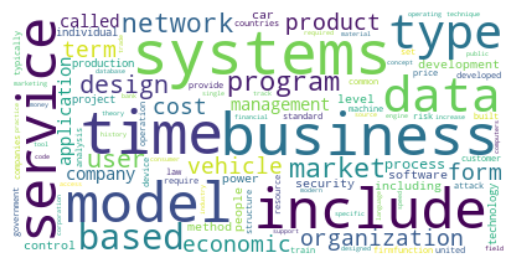

Cluster: 1
Titles
Commerce


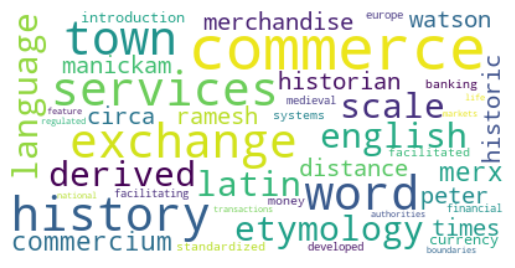

Cluster: 2
Titles
Business hours


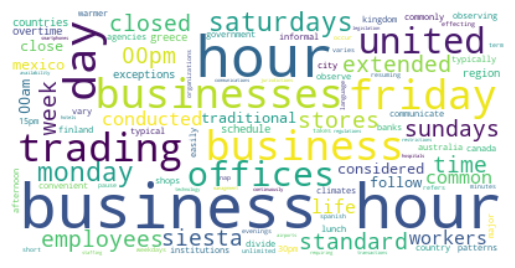

Cluster: 3
Titles
Business travel


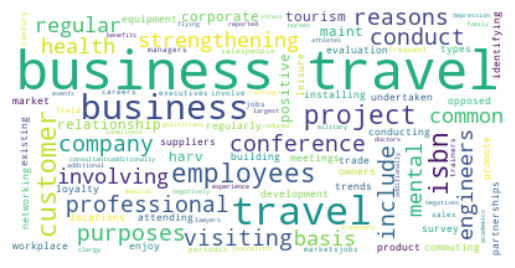

Cluster: 4
Titles
Change management analyst


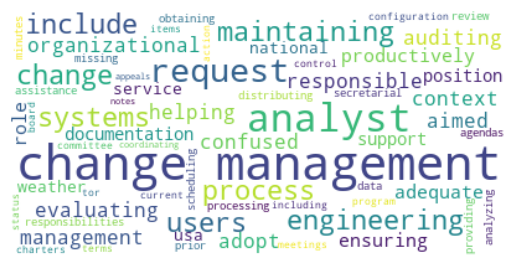

Cluster: 5
Titles
Commercial law


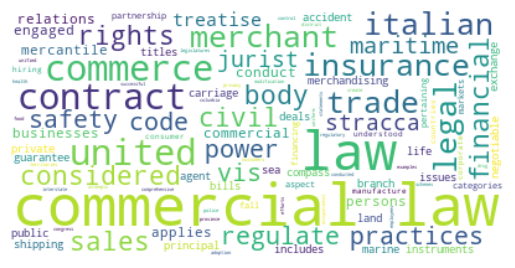

Cluster: 6
Titles
Industry


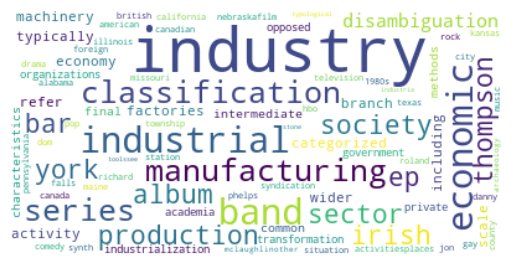

Cluster: 7
Titles
List of economists


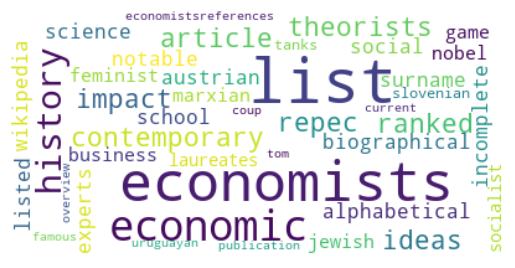

Cluster: 8
Titles
Absolute advantage


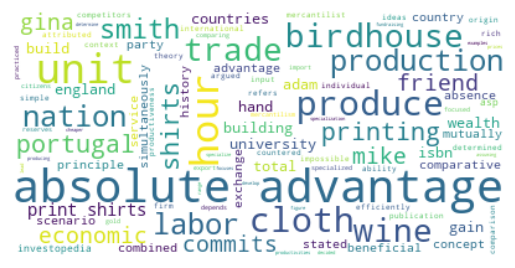

Cluster: 9
Titles
List of oldest companies


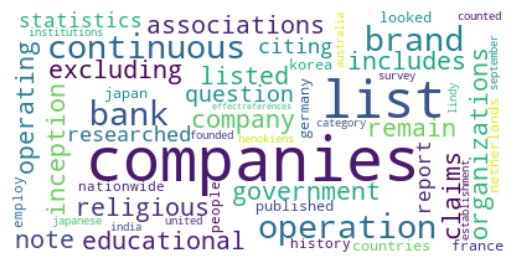

Cluster: 10
Titles
Organizational studies


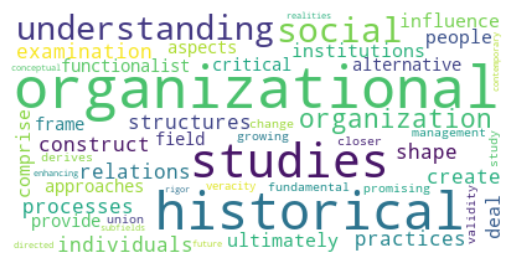

Cluster: 11
Titles
Real estate


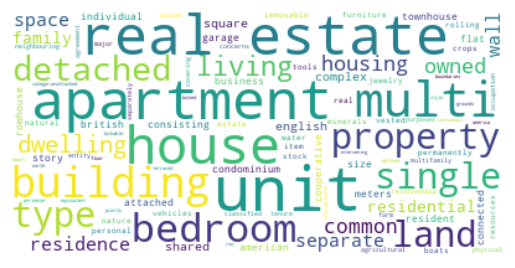

Cluster: 12
Titles
Benefit shortfall


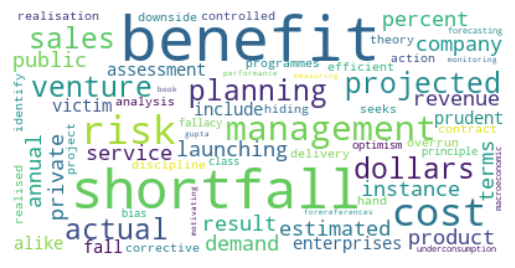

Cluster: 13
Titles
Value migration


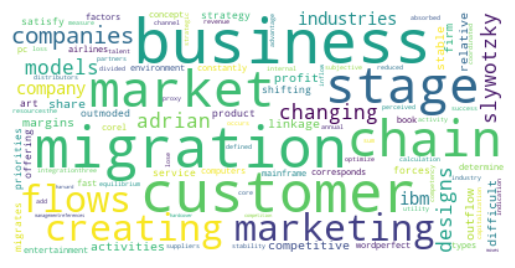

Cluster: 14
Titles
Metacomputing


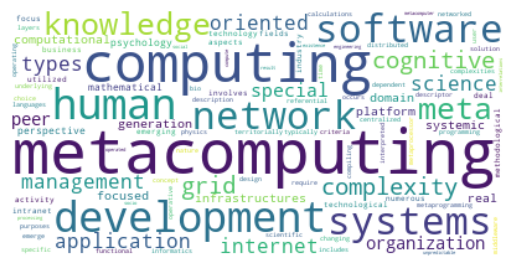

Cluster: 15
Titles
Computation


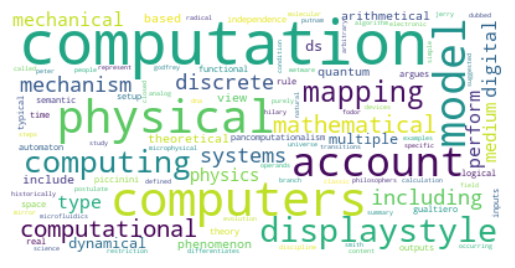

Cluster: 16
Titles
Assembler


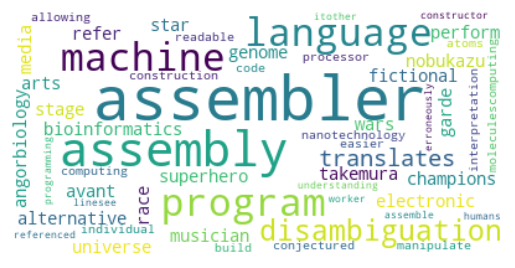

Cluster: 17
Titles
Architectonics


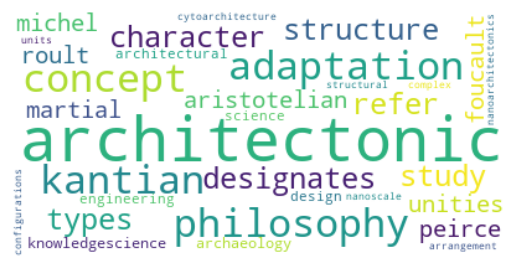

Cluster: 18
Titles
Electronic


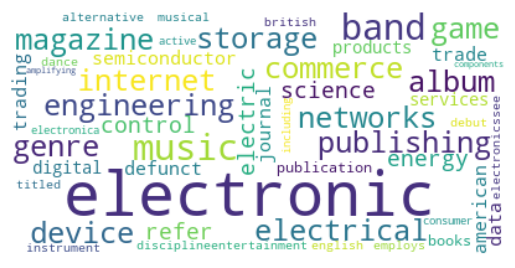

Cluster: 19
Titles
Optical engineering


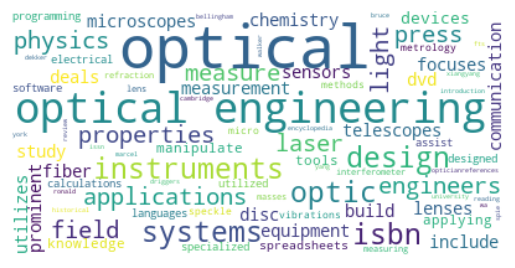

Cluster: 20
Titles
Mix automation


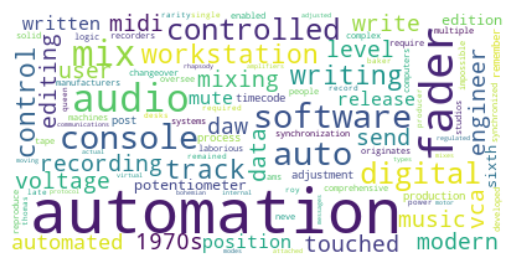

Cluster: 21
Titles
Automated attendant


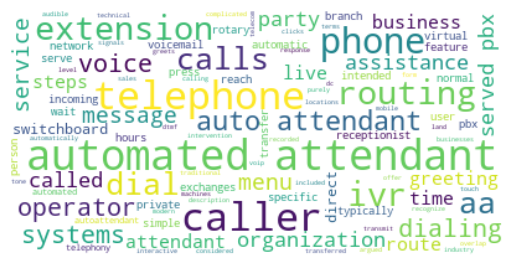

Cluster: 22
Titles
Paint robot


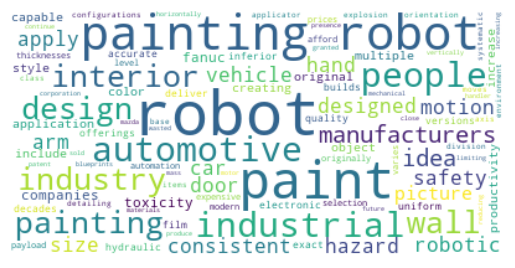

Cluster: 23
Titles
Robotic lawn mower


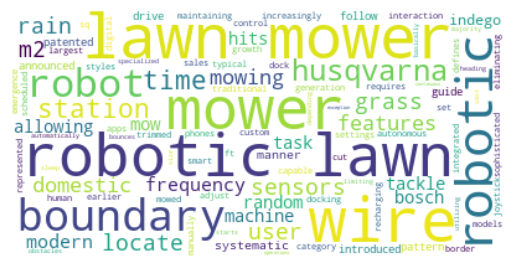

Cluster: 24
Titles
Midibus


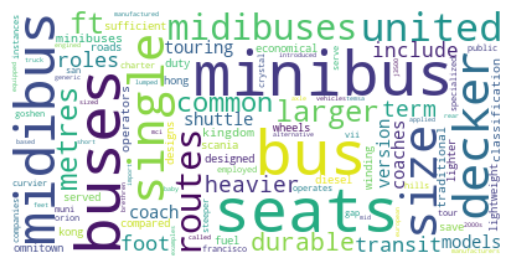

Cluster: 25
Titles
Mountain railway


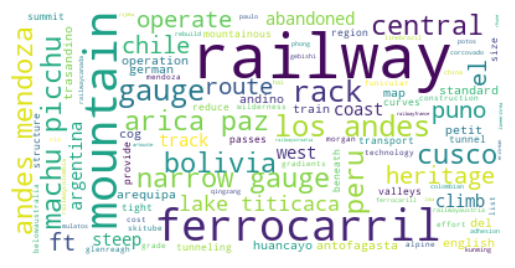

Cluster: 26
Titles
Rail transport by country


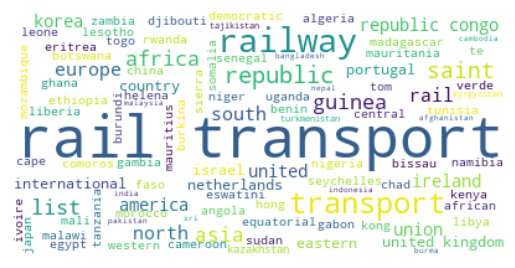

Cluster: 27
Titles
Firewalls and Internet Security


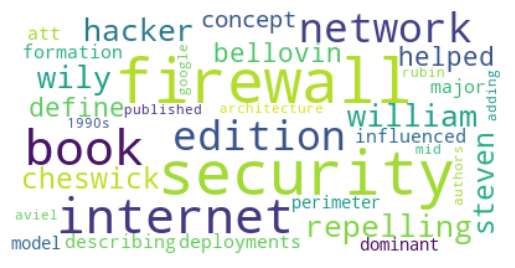

Cluster: 28
Titles
Firewall


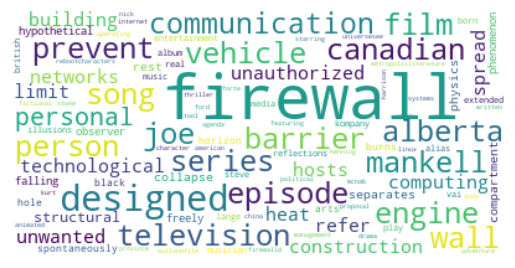

Cluster: 29
Titles
Firewall pinhole


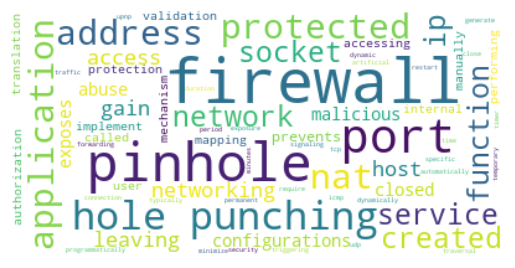

Cluster: 30
Titles
Hole punching (networking)


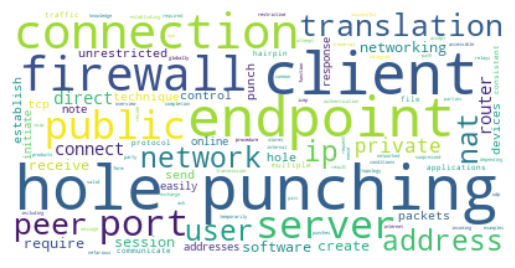

Cluster: 31
Titles
UDP hole punching


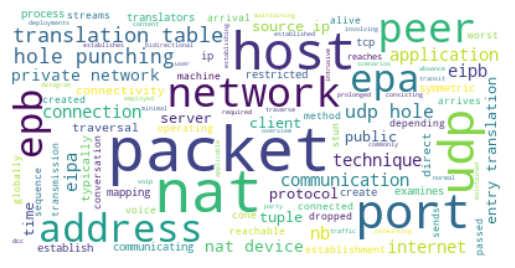

Cluster: 32
Titles
ICMP hole punching


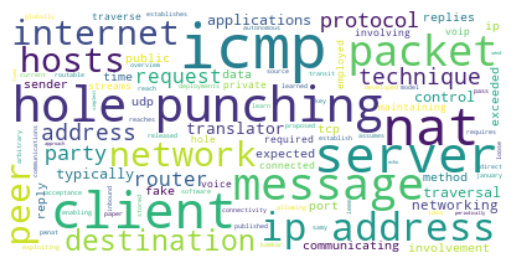

Cluster: 33
Titles
Next-generation firewall


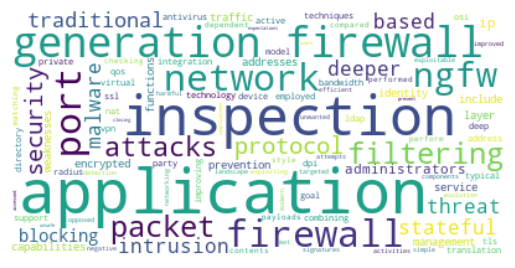

Cluster: 34
Titles
Stateful firewall


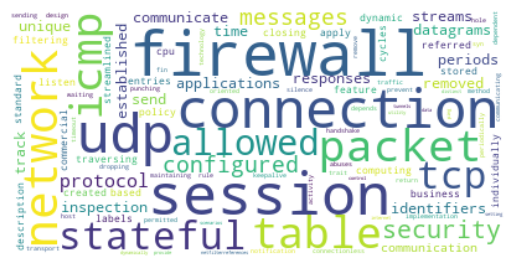

Cluster: 35
Titles
Context-based access control


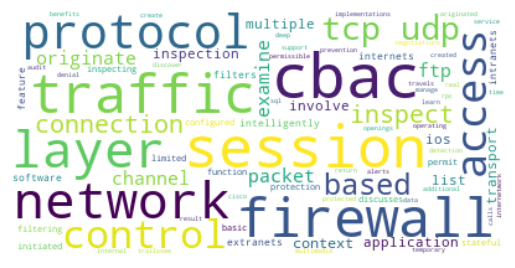

Cluster: 36
Titles
Dual-homed


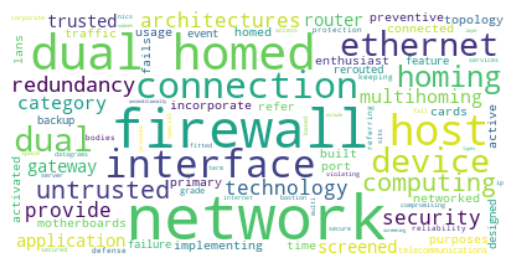

Cluster: 37
Titles
IPFilter


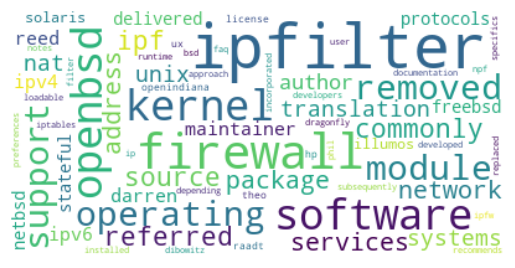

Cluster: 38
Titles
ZoneAlarm


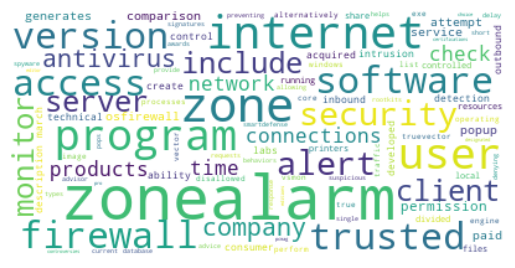

Cluster: 39
Titles
Mobile secure gateway


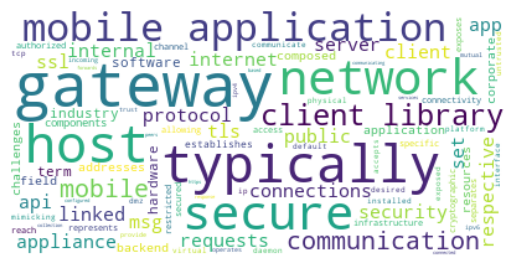

Cluster: 40
Titles
Secure coding


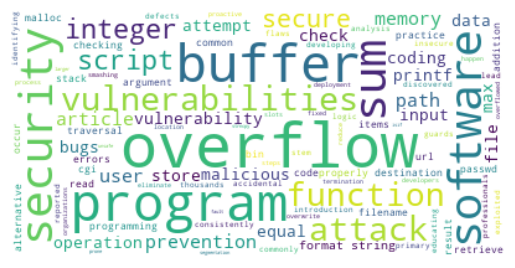

Cluster: 41
Titles
Secure operating system


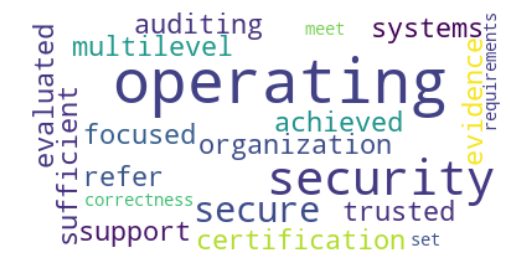

Cluster: 42
Titles
Eavesdropping


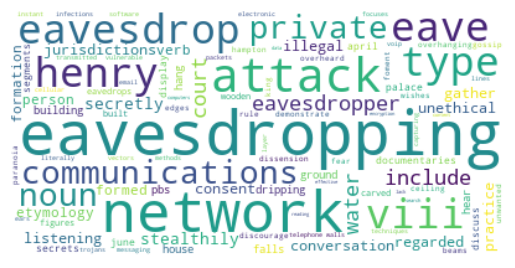

Cluster: 43
Titles
Trojan


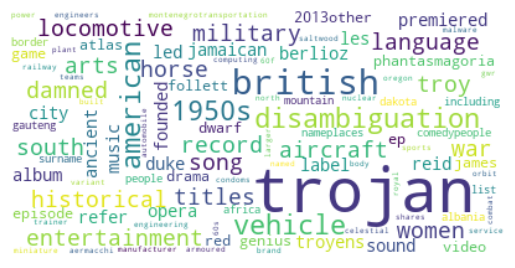

Cluster: 44
Titles
Web application security


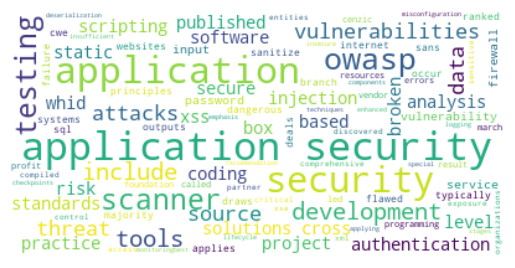

Cluster: 45
Titles
Secure by default


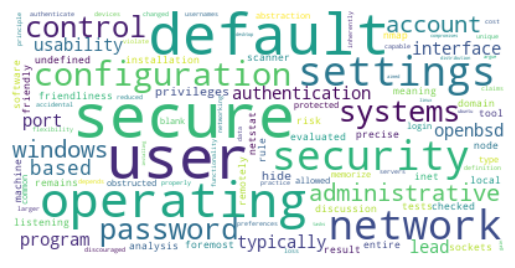

Cluster: 46
Titles
Runtime application self-protection


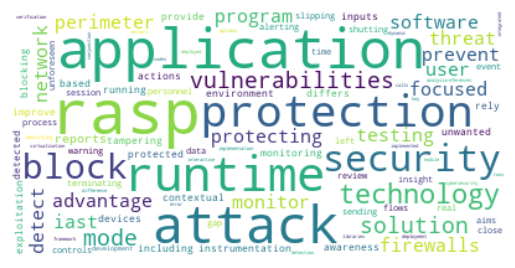

Cluster: 47
Titles
Inference attack


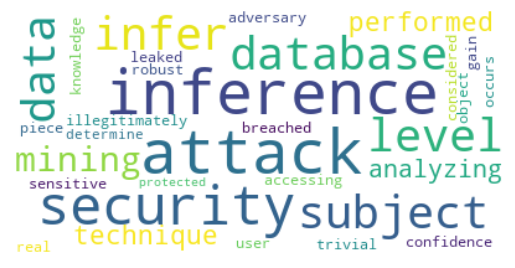

Cluster: 48
Titles
Information Exchange Gateway


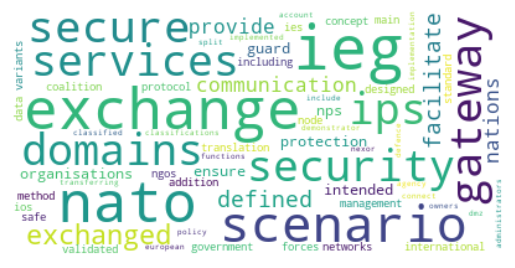

Cluster: 49
Titles
Information Security Automation Program


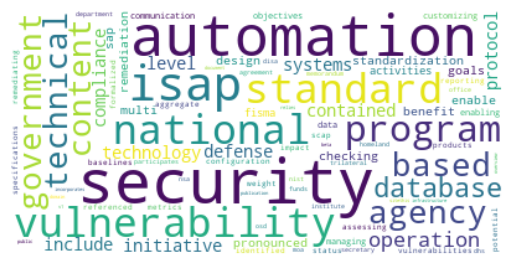

Cluster: 50
Titles
INOC-DBA


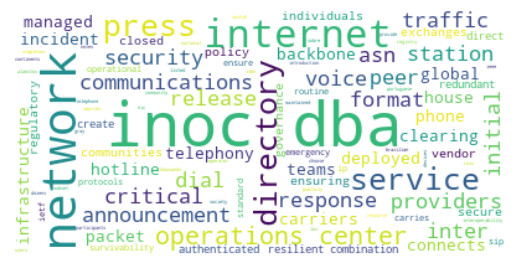

Cluster: 51
Titles
Inter-protocol exploitation


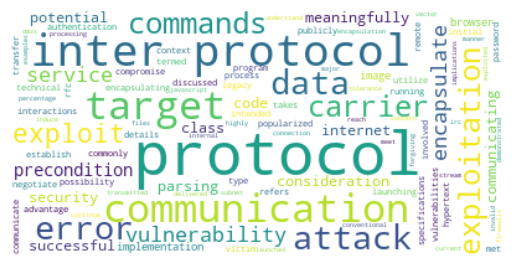

Cluster: 52
Titles
Intrusion tolerance


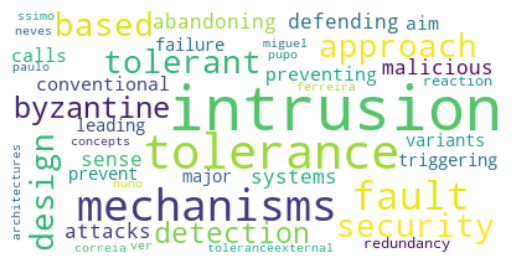

Cluster: 53
Titles
Active defense


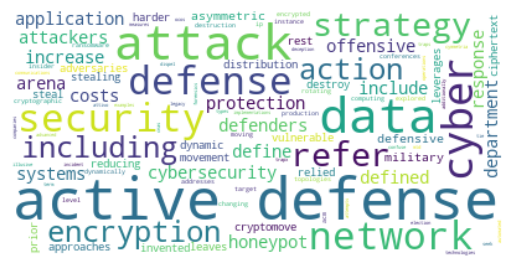

Cluster: 54
Titles
Ambient authority


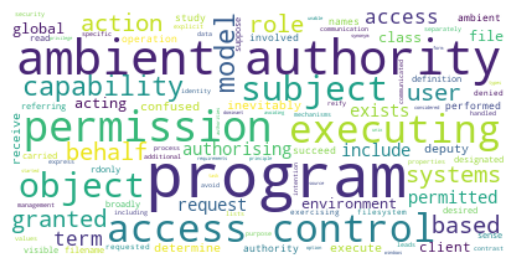

Cluster: 55
Titles
AMD Platform Security Processor


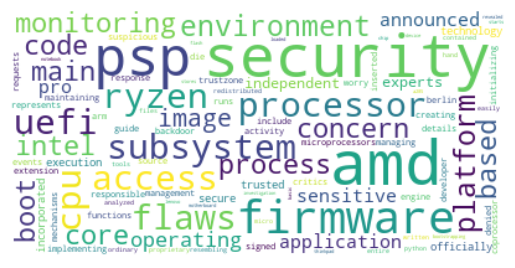

Cluster: 56
Titles
American Innovation and Competitiveness Act


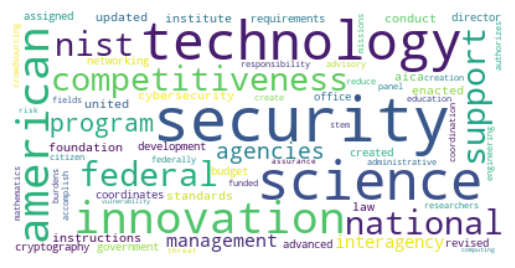

Cluster: 57
Titles
Anderson's rule (computer science)


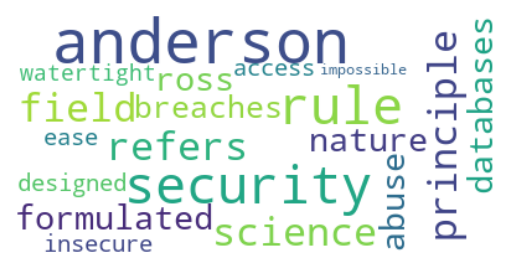

Cluster: 58
Titles
Anomaly Detection at Multiple Scales


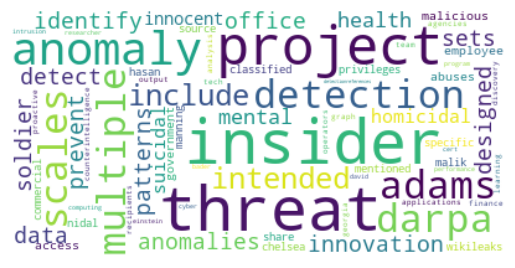

Cluster: 59
Titles
AppArmor Mobile


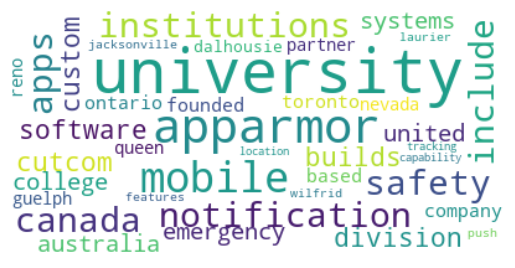

Cluster: 60
Titles
Application portfolio attack surface


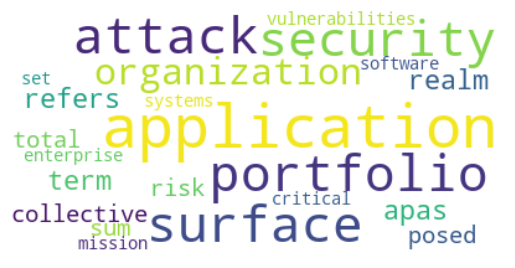

Cluster: 61
Titles
Aptum Technologies


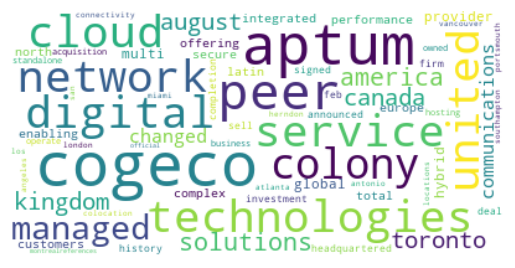

Cluster: 62
Titles
Army Chief Information Officer/G-6


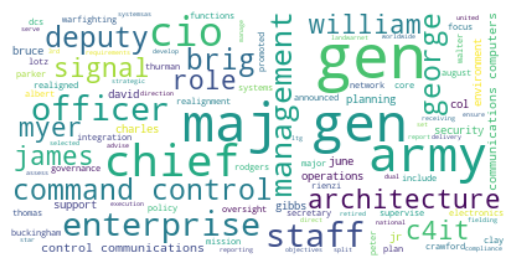

Cluster: 63
Titles
Asset Disposal and Information Security Alliance


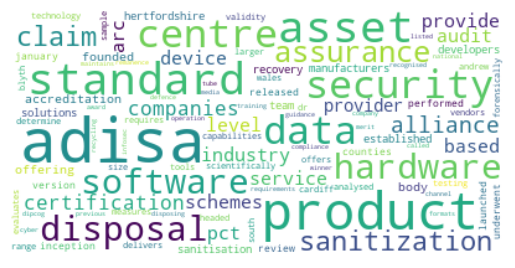

Cluster: 64
Titles
Cyber security awareness


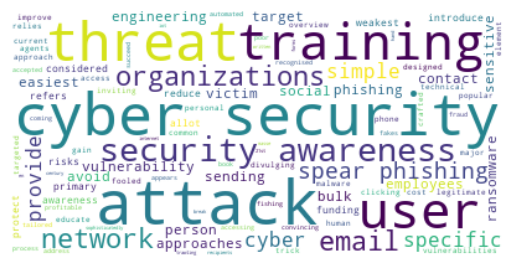

In [146]:
#associate each cluster with a cluster number label
articles_cl = []
labels_100 = []
clusters_keys = list(clusters.keys())
for k in range(len(clusters_keys)):
    key = clusters_keys[k]
    labels_100.extend([k]*len(clusters[key]))
    articles_cl.extend([vertex.element() for vertex in clusters[key]])


articles_cl_df=pd.DataFrame(list(zip([a['title'] for a in articles_cl], [" ".join(a['text']) for a in articles_cl],labels_100)),columns=['title', 'text','cluster'])


result={'cluster':labels_100,'wiki':[text for text in articles_cl_df['text']]}
result=pd.DataFrame(result)
for k in range(len(set(labels_100))):
    s=result[result.cluster==k]
    text=s['wiki'].str.cat(sep=' ')
    text=text.lower()
    text=' '.join([word for word in text.split()])
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    print('Cluster: {}'.format(k))
    print('Titles')
    titles=articles_cl_df[articles_cl_df.cluster==k]['title']         
    print(titles.to_string(index=False))
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

__Discussion about the example studied__:

<div style="text-align: justify">
As we've previously seen, most clusters are unit sized. We observe that the titles of the clusters are composed of rare terms that occur in a specific cluster and not in the others. That's the behavior expected when using the MI metric. However as we can see in the titles, those terms can sometimes not indicate the true semantic of the cluster they represent. For example, the term <b>vallorcine</b> cannot help determine what cluster 25 is about; or again the term <b>1046</b> is not helpful in determining what cluster 8 is about (which makes me think that keeping numbers in our texts is not worth it). Besides, the working of word clouds is different from that of mutual information-based labeling. A Words-cloud representation happens to highlight fairly well relevant terms inside each cluster. This is due to the fact that they associate high weights to terms appearing the most knowing that stopwords were removed. Unlike the MI-based method, Word cloud representations do not take into account the distribution of terms appearing in other clusters which sometimes prove beneficial, but not always.

As the literature suggests, there isn't one best way to evaluate clusters. Research is still on-going.
</div>

<a id="eep"></a>
## End to End Pipeline

See the <b>Readme.md</b> file associated with this project to run the end to end pipeline.

I am following the <b>ETL</b> (Extract Transform Load) principles to build a pipeline. Although mostly used in Data warehousing, it proves relevant as it is applicable here and it is a way to showcase my skills.


<a id="qd"></a>
## Quality discussion

See [Observation & Discussion](#od)

<a id="mlp"></a>
## ML algorithms with similar performance


We are going to have a look at **K-means clustering** and **Hierarchical Clustering**, after representing our wikipedia documents by vectors using scikit-learn's **TFIDF vectorizer**. Other vectorizers exist such as **Word2Vec**, **FastText** or **GloVe** to name a few but TFIDF proves to be a good vectorizer and is very quick to implement.
K-means clustering is generally a good algorithm for this task. It aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean (cluster centers or cluster centroid), serving as a prototype of the cluster.The basic idea behind k-means consists of defining k clusters such that total within-cluster variation (or error) is minimum. We also take a look at Hierarchical Clustering which is relevant as it can highlight hierarchy in our clustering (highlight subtopics of topics).

In [148]:
from nltk import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import chi2
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.cluster import KMeans
import matplotlib as mpl
from sklearn.metrics import adjusted_rand_score

In [149]:
# We transform our articles list of dict into dataframes.

def create_articles_df(articles):
    """ Creates a pandas dataframe where the columns are the attributes of articles."""
    
    # creating a pandas dataframe
    titles = [article['title'] for article in articles]
    contents = [article['content'] for article in articles]
    texts = [article['text'] for article in articles]
    topics = [article['topic'] for article in articles]
    articles_df = pd.DataFrame(index=range(len(texts)),columns=['title', 'content', 'text', 'topic'])
    articles_df['title'] = titles
    articles_df['content'] = contents
    articles_df['text'] = [" ".join(text) for text in texts]
    articles_df['topic'] = topics
    articles_df = articles_df.sort_values("title")

    return articles_df

In [150]:
articles_df = create_articles_df(articles)

In [151]:
# Get stem to lemme correspondance for future visualization of the most important words in each cluster.
def stem_to_lem(df):
    """ Creates 2 python dicts out of articles dataset:
    a stem to lemme dict and a word to lemme dict. Useful for visualization afterwards.
    """
    all_text = ' '.join(df['text'])
    all_text = ' '.join(set(all_text.split()))
    stem_to_lem_dict = dict()
    words_to_lem_dict = dict()
    for word in all_text.split():
        stem = PorterStemmer().stem(word)
        if stem not in stem_to_lem_dict:
            lem = WordNetLemmatizer().lemmatize(word)
            stem_to_lem_dict[stem] = lem
            words_to_lem_dict[word] = lem
    return stem_to_lem_dict, words_to_lem_dict

In [152]:
stem_to_lem_dict, words_to_lem_dict = stem_to_lem(articles_df)

Let's apply stemming to our text dataset.

In [153]:
def stemming(text):
    """ Applying stemming to each word of the given article text """
    return(" ".join([PorterStemmer().stem(w) for w in text.split()]))

In [154]:
articles_df['text'] = articles_df['text'].apply(lambda x: stemming(x))
articles_df.head()

,title,content,text,topic
309,AMD Platform Security Processor,<p>The <b>AMD Platform Security Processor</b> ...,amd platform secur processor amd platform secu...,cybersecurity
62,Absolute advantage,"<p>In economics, the principle of <b>absolute ...",absolut advantag econom principl absolut advan...,business
231,Access control,"<p class=""mw-empty-elt"">\n</p>\n\n<p>In the fi...",access control field physic secur secur access...,cybersecurity
212,Accessibility,<p><b>Accessibility</b> in the sense considere...,access access sens consid refer design product...,technology
0,Accounting,"<p class=""mw-empty-elt"">\n</p>\n\n<p><b>Accoun...",account account account measur process commun ...,business


In [155]:
# We instantiate tfidf vectorizer
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5,
                        ngram_range=(1, 2), 
                        stop_words='english')

# We transform each text into a vector
features = pd.DataFrame(tfidf.fit_transform(articles_df['text']).toarray())
labels = articles_df['topic']

<a id="viz"></a>
### 3D visualization of articles

Let's visualize our data into a 3D space using dimensionality reduction techniques such as PCA and T-SNE.

In [174]:
#sklearn imports
from sklearn.decomposition import PCA #Principal Component Analysis
from sklearn.manifold import TSNE #T-Distributed Stochastic Neighbor Embedding

#plotly imports
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [175]:
#PCA with three principal components
def plot_3d(features, labels, titles=None, classes=['business', 'cybersecurity', 'technology'], model='TSNE', perplexity=10):
    """ Plot high dimensional vectors in a 3D space using TSNE or PCA.
    @params:
        features: the vector representation of the documents to represent. (pandas.DataFrame)
        labels: the cluster labels. (pandas.Series | array)
        titles: the label of each point as we hover over them. (pandas.Series | array)
        model: the dimensionality reduction technique. (PCA | TSNE)
    """
    if model == 'TSNE':
        model = TSNE(n_components=3, perplexity=perplexity)
    elif model == 'PCA':
        model = PCA(n_components=3)
    components_df = pd.DataFrame(model.fit_transform(features))
    # "C1_3d" means: 'The first principal component of the components created for 3-D visualization etc...'
    components_df.columns = ["C1_3d", "C2_3d", "C3_3d"]
    # We concatenate these newly created DataFrames to `features` so that they can be used by `features` as columns.
    features_plot = pd.concat([features,components_df], axis=1, join='inner')
    features_plot["dummy"] = 0
    features_plot["Cluster"] = labels
    
    # Now we divide our DataFrame, features_plot, into three new DataFrames.
    #Each of these new DataFrames will hold all of the values contained in exacltly one of the clusters. 
    #For example, all of the values contained within the DataFrame, cluster_business will belong to 'business topic' etc...
    cluster_0 = features_plot[features_plot["Cluster"] == classes[0]]
    cluster_1 = features_plot[features_plot["Cluster"] == classes[1]]
    cluster_2 = features_plot[features_plot["Cluster"] == classes[2] ]
    
    if titles is not None:
        titles_0 = titles[features_plot["Cluster"] == classes[0]] 
        titles_1 = titles[features_plot["Cluster"] == classes[1]] 
        titles_2 = titles[features_plot["Cluster"] == classes[2]] 
    else:
        titles_0, titles_1, titles_2 = None, None, None
    
    #Instructions for building the 3-D plot

    #trace1 is for '0'
    trace1 = go.Scatter3d(
                        x = cluster_0["C1_3d"],
                        y = cluster_0["C2_3d"],
                        z = cluster_0["C3_3d"],
                        mode = "markers",
                        name = str(classes[0]),
                        marker = dict(color = 'rgba(255, 128, 255, 0.8)'),
                        text = titles_0)

    #trace2 is for '1'
    trace2 = go.Scatter3d(
                        x = cluster_1["C1_3d"],
                        y = cluster_1["C2_3d"],
                        z = cluster_1["C3_3d"],
                        mode = "markers",
                        name = str(classes[1]),
                        marker = dict(color = 'rgba(255, 128, 2, 0.8)'),
                        text = titles_1)

    #trace3 is for '2'
    trace3 = go.Scatter3d(
                        x = cluster_2["C1_3d"],
                        y = cluster_2["C2_3d"],
                        z = cluster_2["C3_3d"],
                        mode = "markers",
                        name = str(classes[2]),
                        marker = dict(color = 'rgba(0, 255, 200, 0.8)'),
                        text = titles_2)

    data = [trace1, trace2, trace3]

    title = "Visualizing Clusters in Three Dimensions Using " + str(model)

    layout = dict(title = title,
                  xaxis= dict(title= 'C1',ticklen= 5,zeroline= False),
                  yaxis= dict(title= 'C2',ticklen= 5,zeroline= False)
                 )

    fig = dict(data = data, layout = layout)

    iplot(fig)
    

#### Principal Component Analysis (PCA)

In [176]:
plot_3d(features, labels,titles=articles_df['title'], model='PCA')

As we hover over the points we can see the titles of the documents.<br>
The clusters are not clearly separated. Two major reasons can explain this fact. Either the representation of the articles is not really good or the dimensionality reduction technique is not very good. The solutions to improve it are to try out other vectorizer or play more with the parameters of PCA.

#### *T-Distributed Stochastic Neighbor Embedding* (T-SNE):

We have to decide what level of `perplexity` we would like to use for our T-SNE algorithm. The `perplexity` is a hyperparameter used in the T-SNE algorithm that greatly determines how the data returned from the algorithm is distributed.

I have found, through a few trials, that `perplexity = 10` works fairly well for this data.

In [83]:
#Set our perplexity
perplexity = 10
plot_3d(features, labels, titles=articles_df['title'], model='TSNE', perplexity=perplexity)

__T-SNE remarks:__

TSNE highlights better the clusters in our dataset. We can distinguish the clusters very well. This suggests that TFIDF vectorizer do quite a good job representing documents. One major difference between the plots created by PCA and the plots created by T-SNE, is the shape. Because both PCA and T-SNE perform dimensionality reduction in very different ways (and with different objectives), the resulting shape or distibution of the points produced by the algorithms will almost always be very different. One needs to bear in mind that the plots resulting from the T-SNE algorithm are quite variable, in that they depend very heavily on the value chosen for `perplexity`.

<a id="mcm"></a>
### ML clustering models

In this section we are going to approach the clustering in two different ways: **Supervised and Non-supervised clusterings**. We are first going to follow a supervised clustering approach where we'll assume there are three clusters  corresponding to the three topics of our dataset. Then we'll perform an unsupervised clustering with K-means, selecting the number of clusters, $k$, with a **Silhouette** analysis.

<a id="sc"></a>
#### Supervised clustering

__K-Means Clustering__

We set $k$ to be the number of topics in our dataset, in this case 3. We'll evaluate different hyperparameters with the __Adjusted Rand Index__ metric defined as follows:

A classification $\mathcal{C}$ is defined as the set of pairs of observations which are in the same group, among all possible pairs. We denote by $n_{11}$ the number of pairs which are in the same group following $\mathcal{C}$ and $\mathcal{C}'$, by $n_{00}$ the number of pairs which are in different groups following $\mathcal{C}$ and $\mathcal{C}'$, by $n_{10}$ the number of pairs in the same group following $\mathcal{C}$ and different groups following $\mathcal{C}'$, and finally by $n_{01}$ the number of pairs in the same group following $\mathcal{C}'$ and different groups following $\mathcal{C}$. If $\mathcal{C}$, $\mathcal{C}'$ are two different classifications, the Rand index is the probability that the two classifications agree for a randomly chosen pair of data. It can be expressed as the following: 
 $$ \mathcal{R} (\mathcal{C}, \mathcal{C}') = \frac{2(n_{00}+n_{11})}{N(N-1)}, \ \ \ 0<\mathcal{R}<1$$ 
 The **Adjusted Rand index (ARI)** is defined as:
 $$ \mathcal{R}_{adj} (\mathcal{C}, \mathcal{C}') = \frac{\mathcal{R} - \mathbb{E}(\mathcal{R})}{max(\mathcal{R}) - \mathbb{E}(\mathcal{R})}$$ 
  where, $\mathbb{E}(\mathcal{R})$ is the expectation of the Rand index and $max(\mathcal{R})$ is the maximum value it can reach.

*Initialisation method*<br>
Let's try two centroids initialization methods, namely *kmeans++* and *random initialization* and find out the best initialization method.

In [180]:
# adjusted rand index arrays
ARI_kmeans =[]
ARI_random =[]

for i in tqdm(range(10)):
    kmeans = KMeans(n_clusters=3, n_init=10, init='k-means++', random_state=0).fit(features)
    ARI_kmeans.append(adjusted_rand_score(kmeans.labels_, labels))

    kmeans = KMeans(n_clusters=3, n_init=10, init='random').fit(features)
    ARI_random.append(adjusted_rand_score(kmeans.labels_, labels))

print('ARI mean with k-means++ initialization: ', np.mean(ARI_kmeans))
print('ARI std with k-means++ initialization: ', np.std(ARI_kmeans))
print('ARI mean with random initialization: ', np.mean(ARI_random))
print('ARI std with random initialization: ', np.std(ARI_random))

100%|██████████| 10/10 [00:11<00:00,  1.17s/it]

ARI mean with k-means++ initialization:  0.45103879845784195
ARI std with k-means++ initialization:  5.551115123125783e-17
ARI mean with random initialization:  0.42290335745099555
ARI std with random initialization:  0.02952961964531098


We observe that the ARI mean for the k-means++ initialization is significantly better than that of the random initialization method. The ARI score for both initialization fluctuates and is sometimes degraded. Therefore, for a different initialization we can obtain different clustering. The k-means++ initialization has better results so we'll prefer it over the random initialization.

<div class="alert alert-block alert-warning">
Note that we are not setting a random_state when using the random initialization method as there would not be any randomization if we did.
</div>

Let's run a K-means model with 'k-means++' as initialisation method.

In [183]:
kmeans_3 = KMeans(n_clusters = 3, init='k-means++', random_state = 0, n_init = 150)    
kmeans_3.fit(features)
kmeans_3_labels = kmeans_3.labels_

Let's plot the confusion matrix of the results.

In [199]:
pd.crosstab(index = labels, 
            columns = kmeans_3_labels, 
            rownames = ['Topic'], 
            colnames = ['Cluster'])

Cluster,0,1,2
Topic,,,
business,3,96,2
cybersecurity,87,3,1
technology,43,29,58


We notice that Cybersecurity related topics are quasi exclusively (96%) clustered in cluster 0 which is good. $33\%$ of Technology related topics fall in cluster 0,  22% in cluster 1 and 45% in cluster 2. This highlights the **close relationship between technology-related topics and cybersecurity-related topics**. Cluster 2 is majorly (95%) composed of technology-related topics. This suggests that cluster 2 rather represents Technology related topics. Cluster 1 contains majorly business related topics and a few of the others.

More time would have allowed me to examine more closely the few articles that are out of their clusters. For example the five business articles that are out of cluster 1. My thought is that they might be more or less connected to the other topics.

Let's compute the Adjusted Rand Index.

In [186]:
adjusted_rand_score(kmeans_3_labels, labels)

0.4172945203113601

The result is not that great. One can view it as random clustering however we claim it is not the case as the clustering follows a given algorithm even though there exists some shed of randomness (initialization of cluster centroids for instance). 

Let's visualize the clusters with T-SNE.

In [185]:
plot_3d(features, kmeans_3_labels, titles=articles_df['title'], classes = [0,1,2], model='TSNE')

The colors form clusters which suggests that the clustering method is fairly good and that the representation technique should separate more the clusters in order to have better results. In fact as we hover over the points in the plot above, we observe that Cybersecurity and Technology topics are more mingled with each other than theyr are with Business related topics. One thing also to bear in mind is that we are not sure whether TSNE reflects really well the layout of the high dimensional vectors into a 3D space.

Let's plot a wordcloud visualization of our clusters.

In [259]:
# Getting a Title-Cluster correspondance.
wiki_titles = articles_df['title']
wiki_clusters=pd.DataFrame(list(zip(wiki_titles,kmeans_3_labels)),columns=['title','cluster'])
print(wiki_clusters.sort_values(by=['cluster']))

                               title  cluster
0    AMD Platform Security Processor        0
145                         IPFilter        0
146           IT baseline protection        0
154                 Inference attack        0
155     Information Exchange Gateway        0
..                               ...      ...
267                    Smart highway        2
136                  High-speed rail        2
265                       Share taxi        2
132         Geotechnical engineering        2
63                               Car        2

[322 rows x 2 columns]


Cluster: 0
Titles
                 AMD Platform Security Processor
                                  Access control
                                  Active defense
                      Advanced persistent threat
                    Adversarial machine learning
                               Ambient authority
     American Innovation and Competitiveness Act
              Anderson's rule (computer science)
            Anomaly Detection at Multiple Scales
                              Antivirus software
                                 AppArmor Mobile
            Application portfolio attack surface
                            Application security
                              Aptum Technologies
                                  Architectonics
              Army Chief Information Officer/G-6
                                       Assembler
Asset Disposal and Information Security Alliance
                           Aurora Generator Test
                                  Authentication
  

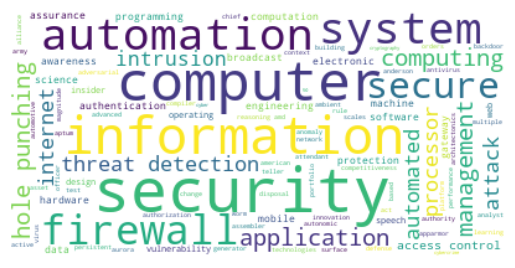

Cluster: 1
Titles
            Absolute advantage
                 Accessibility
                    Accounting
                   Advertising
      Agricultural engineering
     Architectural engineering
                          Bank
                        Barter
             Benefit shortfall
                  Big business
        Biological engineering
        Biomedical engineering
                       Bionics
      Bretton Woods Conference
               Business acumen
               Business broker
               Business ethics
                Business hours
         Business intelligence
                Business model
                 Business plan
     Business process modeling
      Business reference model
                 Business rule
               Business school
               Business travel
                    Capitalism
             Civil engineering
                      Commerce
                Commercial law
                       Company
         Comparative 

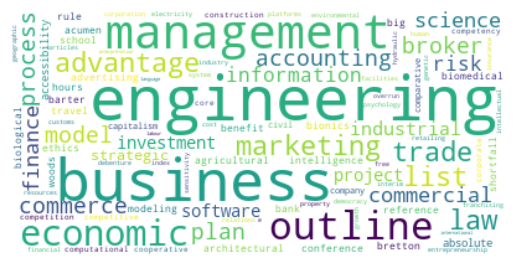

Cluster: 2
Titles
                   All-terrain vehicle
                         Auto rickshaw
              Automated guided vehicle
                Automated pool cleaner
                                   Bus
                   Cable car (railway)
                                   Car
                  Diesel multiple unit
                Electric multiple unit
                Electricity generation
                        Energy storage
                             Funicular
              Geotechnical engineering
                   Grid energy storage
                       Heavy equipment
                       High-speed rail
                            Hovercraft
                               Iceboat
                            Light rail
                 Liquefied natural gas
                            Locomotive
                               Midibus
                               Minibus
                               Minivan
                              Monorail
       

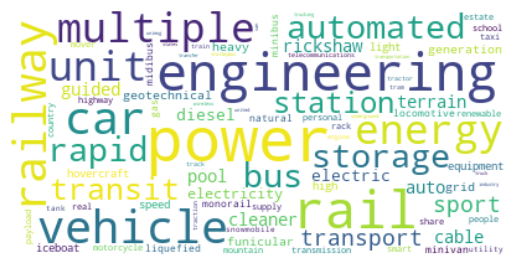

In [260]:
from wordcloud import WordCloud
result={'cluster':kmeans_3_labels,'wiki':wiki_titles}
result=pd.DataFrame(result)
for k in range(0,3):
    s=result[result.cluster==k]
    text=s['wiki'].str.cat(sep=' ')
    text=text.lower()
    text=' '.join([word for word in text.split()])
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    print('Cluster: {}'.format(k))
    print('Titles')
    titles=wiki_clusters[wiki_clusters.cluster==k]['title']         
    print(titles.to_string(index=False))
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


The word cloud visualization, just like the confusion matrix, suggests that cluster 0 is about cybersecurity since the biggest words are {security, computer, firewall, internet, secure, etc...}. Cluster 1 suggests words such as { management, business, economic, accounting, trade, finance } which denote a Business topic. Finally, cluster 2 shows Technology-related words such as {power, railway, automated, storage, rail, engineering, etc...} We clearly distinguish the different topics in our cluster. Moreover, this demonstrates that Cluster-internal labeling performs better than differential labeling in our case.

__Hierarchical clustering__

In [187]:
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree


Let's determine the best linkage method.

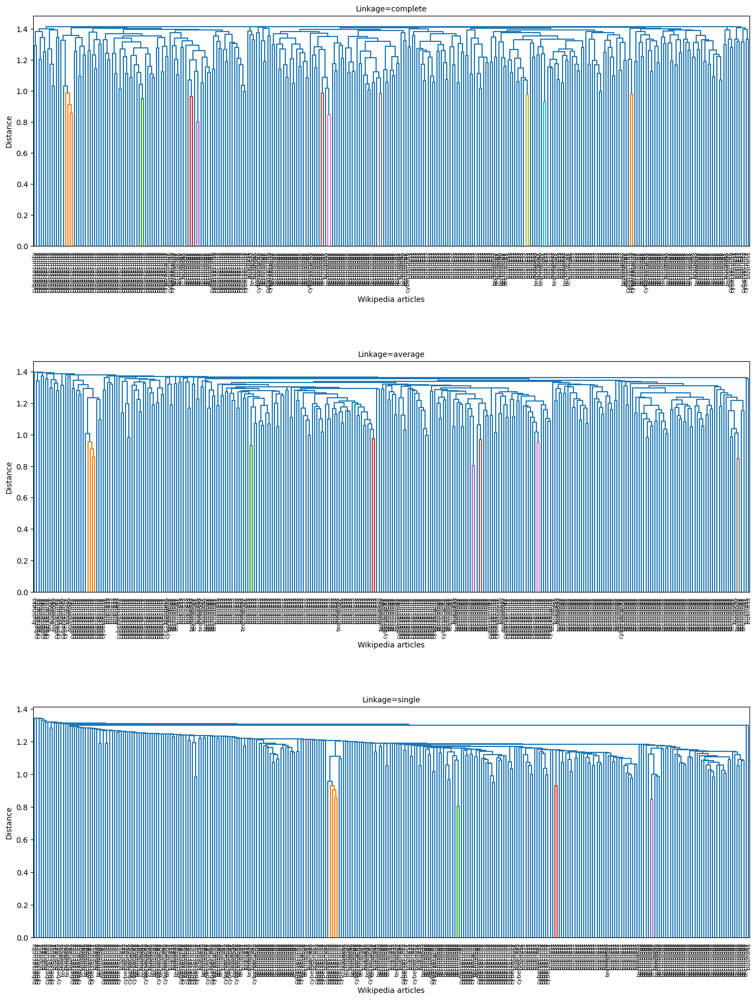

In [188]:
fig, ax = plt.subplots(3,1, figsize=(17,22))
fig.subplots_adjust(hspace=0.5)

linkages = ['complete', 'average', 'single']
for link, axis in zip(linkages, fig.axes):
    hc = linkage(y = features, method=link, metric='euclidean') 
    axis.set_title("Linkage=%s" % link, size=10)
    axis.set_xlabel('Wikipedia articles', size=10)
    axis.set_ylabel('Distance', size=10)
    dendrogram(hc, ax=axis, labels=list(labels), leaf_rotation=90, leaf_font_size=8)

We see that the choice of linkage affects the results obtained. Typically, single linkage will tend to yield trailing clusters: very large clusters onto which individual observations attach one-by-one. On the other hand, complete and average linkage tend to yield more balanced and then attractive clusters. For this reason, complete and average linkage are generally preferred to single linkage.

Let's use our complete linkage hierarchical clustering for the analysis

We cut the dendrogram at the height that will yield a 3 clusters.

In [ ]:
hc_complete = linkage(y = features, method="complete", metric='euclidean') 
hc_complete_3_clusters = cut_tree(hc_complete, n_clusters = 3) 

In [189]:
pd.crosstab(index = labels, 
            columns = hc_complete_3_clusters.T[0], 
            rownames = ['Topic'], 
            colnames = ['Cluster'])

Cluster,0,1,2
Topic,,,
business,1,97,3
cybersecurity,78,10,3
technology,17,108,5


We notice that 97% of the business related wiki articles fall under cluster 0. However, so do technology-related articles. It makes it then hard to associate that cluster with one topic. On the other hand, Cybersecurity related topics are pretty much gathered in cluster 2 with the company of only a few other topics (less than 20%). Let's note that cluster 1 barely have members (only 11 out of 322).

Let's compute the Adjusted Rand Index.

In [191]:
adjusted_rand_score(hc_complete_3_clusters.T[0], labels)

0.32297978385174736

K-means clustering achieves a better ARI score than hierarchical clustering.

Let's plot the TSNE visualization of the hierarchical clustering method.

In [208]:
plot_3d(features,hc_complete_3_clusters.T[0], titles=articles_df['title'], classes = [0,1,2], model='TSNE')

##### Comparison between K-Means and Hierarchical Clusterings

In [190]:
pd.crosstab(index = kmeans_3_labels, 
            columns = hc_complete_3_clusters.T[0], 
            rownames = ['K-Means'], 
            colnames = ['Hierarchical'])

Hierarchical,0,1,2
K-Means,,,
0,92,37,4
1,4,121,3
2,0,57,4


We see that the three clusters obtained using hierarchical clustering and Kmeans clustering are somewhat different. This is quantified by the values outside the diagonal of the confusion matrix. There are more discrepancies in cluster 1 in hierarchical clustering. However, it's worth noting that they agree in quite many instance as suggested by the diagonal of the confusion matrix.

<a id="uc"></a>
#### Unsupervised clustering

In [210]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm


Silhouette analysis can be used to study the separation distance between the resulting clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. This measure has a range of $[-1, 1]$.

Silhouette coefficients (as these values are referred to as) near +1 indicate that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster.

Let's run our analysis.

For n_clusters = 2 The average silhouette_score is : 0.01930525517101817
For n_clusters = 3 The average silhouette_score is : 0.021046862917074017
For n_clusters = 4 The average silhouette_score is : 0.020678998063183587
For n_clusters = 5 The average silhouette_score is : 0.017938922289394817
For n_clusters = 6 The average silhouette_score is : 0.020386549033646627


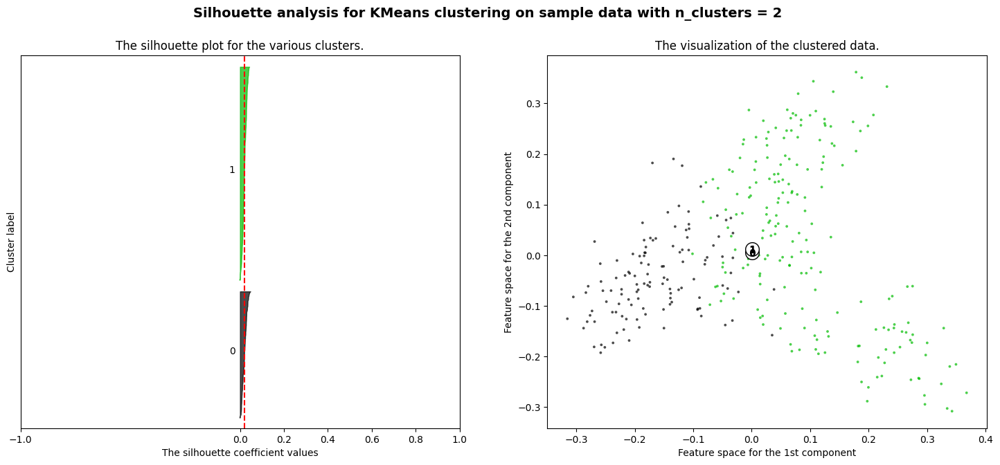

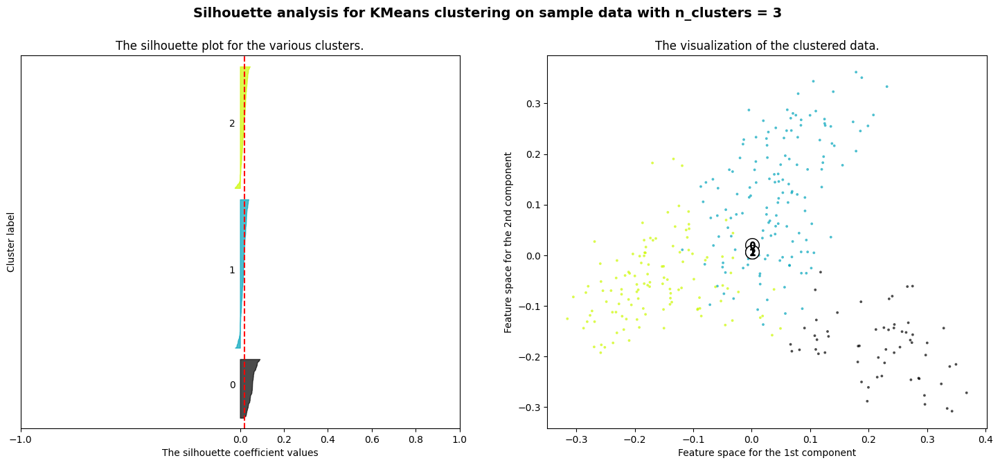

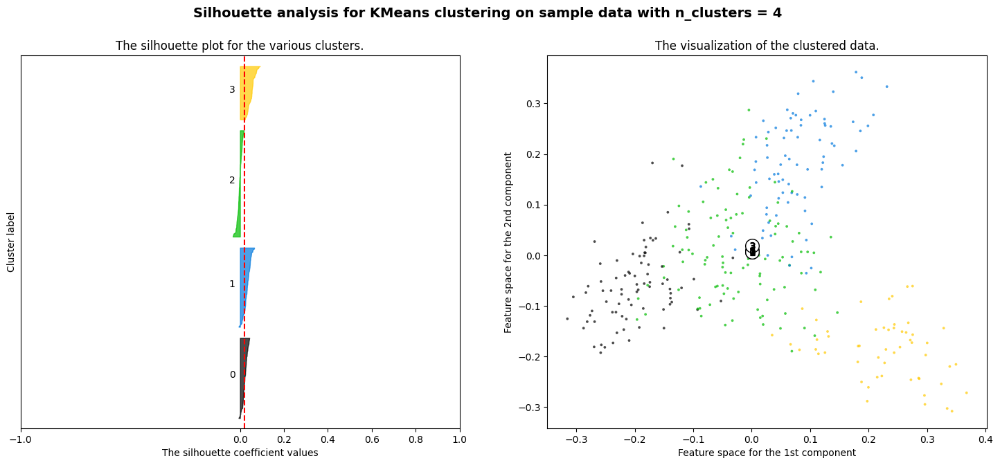

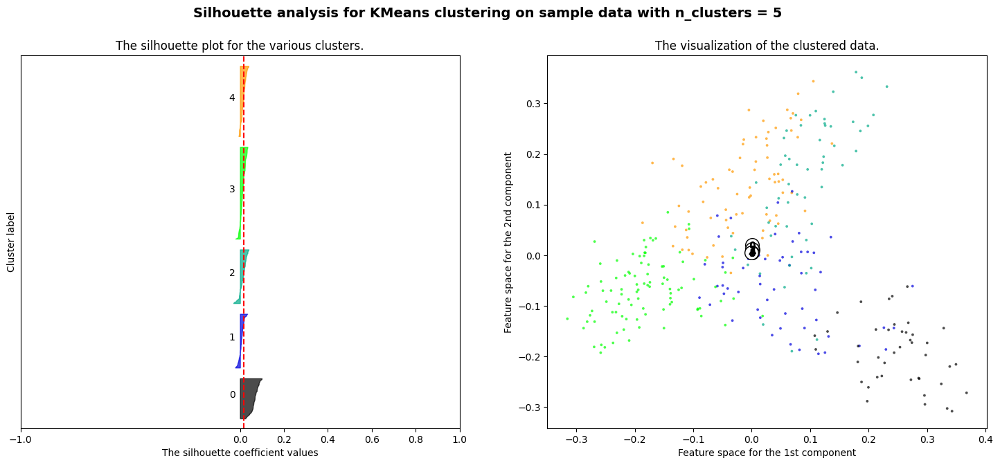

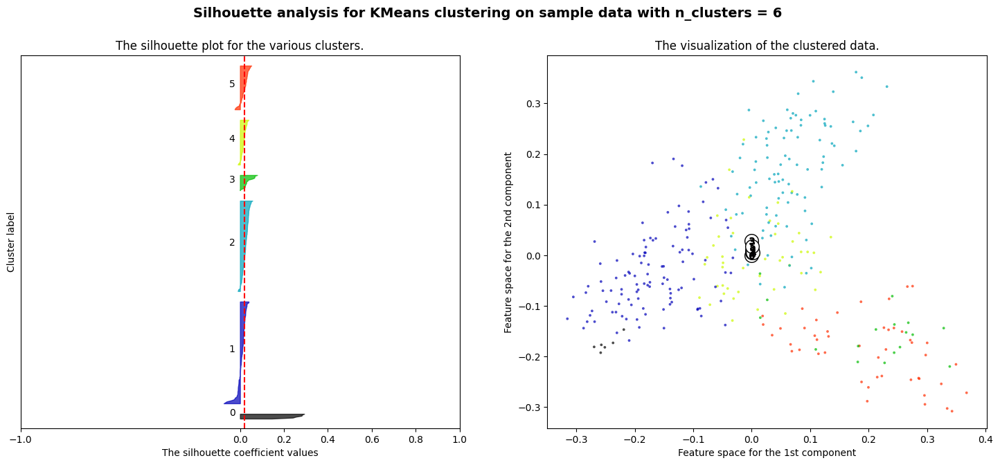

In [219]:
range_n_clusters = [2, 3, 4, 5, 6]
X = np.array(features)
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # Reducing the dimensionality of our features with T-SNE
    X_reduced = PCA(n_components=2).fit_transform(X)
    
    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_reduced[:, 0], X_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st component")
    ax2.set_ylabel("Feature space for the 2nd component")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

The silhouette plot shows that the $k$ value of 5 and 6 are a bad pick for the given data due to the presence of clusters with below average silhouette scores and also due to wide fluctuations in the size of the silhouette plots. Silhouette analysis is more ambivalent in deciding between 3 and 4.

Also from the thickness of the silhouette plot the cluster size can be visualized. The silhouette plot for cluster 1 when $k$ is equal to 3, is bigger in size owing to the grouping of the 2 sub-clusters into one big cluster. However, when $k$ is equal to 4, all the plots are more or less of similar thickness and hence are of similar sizes as can be also verified from the labeled scatter plot on the right. Nevertheless the silhouette score, $s$, for $k=3$, $s_3=0.02104$, is slightly better than that of $k=4$, $s_4=0.02067$. This makes us lean more toward $k=3$. **It is important** to note that the unsupervised clustering results join that of the supervised method in that we find the same number of clusters. However since we took a value of $k=3$ in our previous study in [Supervised Clustering](#sc), we'll consider <b>$k=4$</b> in the sequel.



Let's mention that there are other techniques employed out there to determine $k$ such as the "must know" __Elbow method__ or again the __Gap statistic method__ to name a few. There is no better technique. The most suited one depends on the problem one is facing.

In [261]:
# Fitting a kmean clustering
silhouette_k = 4
model = KMeans(n_clusters=silhouette_k, init='k-means++', max_iter=200, n_init=10)
model.fit(features)
labels_pred = model.labels_

In [262]:
silhouette_avg = silhouette_score(features, labels_pred)
print("For k =", silhouette_k,
          "The average silhouette_score is :", silhouette_avg)

For k = 4 The average silhouette_score is : 0.01714176725185178


Let's plot a wordcloud representation of our clusters.

In [263]:
# Getting a Title-Cluster correspondance.
wiki_titles = articles_df['title']
wiki_clusters=pd.DataFrame(list(zip(wiki_titles,labels_pred)),columns=['title','cluster'])
print(wiki_clusters.sort_values(by=['cluster']))

                                         title  cluster
140                                 Hovercraft        0
28                               Auto rickshaw        0
287                                       Tank        0
102                       Diesel multiple unit        0
218                              Multiple unit        0
..                                         ...      ...
158  Information assurance vulnerability alert        3
159                       Information security        3
161     Information security operations center        3
148                         IT risk management        3
321                                  ZoneAlarm        3

[322 rows x 2 columns]


Cluster: 0
Titles
                   All-terrain vehicle
                         Auto rickshaw
                                   Bus
                   Cable car (railway)
                                   Car
                  Diesel multiple unit
                Electric multiple unit
                             Funicular
                       High-speed rail
                            Hovercraft
                               Iceboat
                            Light rail
                            Locomotive
                               Midibus
                               Minibus
                               Minivan
                              Monorail
                            Motorcycle
                      Mountain railway
                         Multiple unit
                          People mover
                Personal rapid transit
                          Rack railway
             Rail transport by country
                         Rapid transit
       

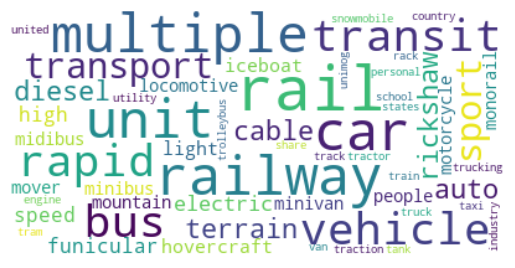

Cluster: 1
Titles
                  Accounting
                        Bank
                      Barter
    Bretton Woods Conference
             Business broker
             Business ethics
                  Capitalism
              Commercial law
                     Company
       Comparative advantage
                 Competition
                 Cooperative
               Corporate law
                 Corporation
              Customs broker
                   Debenture
          Economic democracy
                   Economics
            Entrepreneurship
                     Finance
         Financial economics
                 Franchising
                  Free trade
Index of accounting articles
                   Insurance
       Intellectual property
                  Investment
       Investment management
            Labour economics
           Limited liability
                   Mediation
                       Money
   Outline of commercial law
        Outline of econom

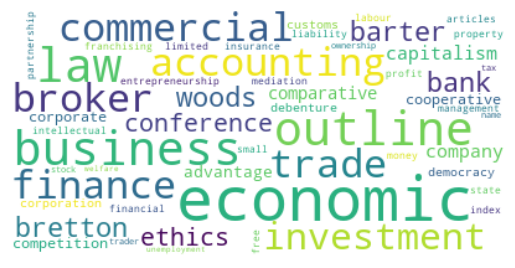

Cluster: 2
Titles
                         Absolute advantage
                              Accessibility
                                Advertising
                   Agricultural engineering
                            AppArmor Mobile
                         Aptum Technologies
                             Architectonics
                  Architectural engineering
         Army Chief Information Officer/G-6
                                  Assembler
                        Automated attendant
                   Automated guided vehicle
                     Automated pool cleaner
                        Automated reasoning
                        Autonomic computing
                          Benefit shortfall
                               Big business
                     Biological engineering
                     Biomedical engineering
                                    Bionics
                       Broadcast automation
                      Broadcast engineering
              

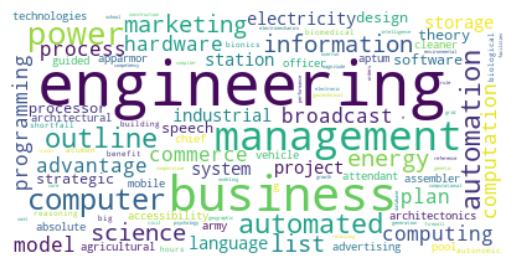

Cluster: 3
Titles
                 AMD Platform Security Processor
                                  Access control
                                  Active defense
                      Advanced persistent threat
                    Adversarial machine learning
                               Ambient authority
     American Innovation and Competitiveness Act
              Anderson's rule (computer science)
            Anomaly Detection at Multiple Scales
                              Antivirus software
            Application portfolio attack surface
                            Application security
Asset Disposal and Information Security Alliance
                           Aurora Generator Test
                                  Authentication
                                   Authorization
                        Automated teller machine
                             Automotive security
                            Backdoor (computing)
                       Change management analyst
  

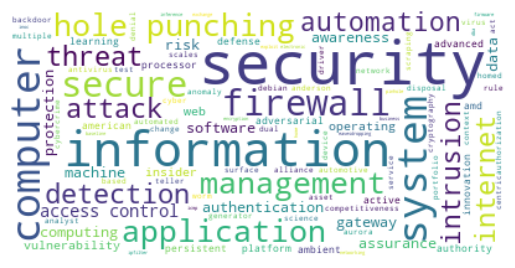

In [264]:
from wordcloud import WordCloud
result={'cluster':labels_pred,'wiki':wiki_titles}
result=pd.DataFrame(result)
for k in range(0,silhouette_k):
    s=result[result.cluster==k]
    text=s['wiki'].str.cat(sep=' ')
    text=text.lower()
    text=' '.join([word for word in text.split()])
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    print('Cluster: {}'.format(k))
    print('Titles')
    titles=wiki_clusters[wiki_clusters.cluster==k]['title']         
    print(titles.to_string(index=False))
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


Th wordcloud representation for $k=4$ doesn't seperate topics as better as that for $k=3$. Cluster 3 for instance mingles different types of topical words even though the other clusters depict rather well separate topics. This encourages the choice of $k=3$.

<a id="ut"></a>
## Unit tests

In addition to taking special care throughout all the project not to leave any errors and testing the project setup in new environments, we test mainly two things:
- Preprocessing functions
- Graph clustering

<a id="pret"></a>
### Preprocessing tests

These tests aim to test the different preprocessing steps making sure that they really do what we expect them to do.
Note that using functions for each preprocessing step make it easy to test the different steps. I hope it demonstrates my modest software design skills.

<a id="gct"></a>
### Graph clustering tests

We are going to test the graph based clustering method (connected components). The idea is given a set of articles, we work out the connected articles ourselves. Then we compare the latter with those output by our graph-based method. If the clusters are the same the test passed, otherwise, we'll know that our clustering algorithm is flawed.

Given a connectivity threshold, to determine ourselves if two articles are connected, it is simple, we determine whether or not they have a number of common tokens greater than the connectivity threshold.

I copied a few articles from the dataset inside a json file named `test_data.json` located in the data folder of the project.

In our test we choose a connectivity threshold of 15.